# Task 1 Basics

In [1]:
# Import necessary libraries
import torch
import torchvision
import torchvision.transforms as transforms
import numpy as np
import matplotlib.pyplot as plt
import json
import os
from PIL import Image
from tqdm import tqdm

# Check if GPU is available
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

# Mount Google Drive (if not already mounted)
from google.colab import drive
drive.mount('/content/drive')

# Load the labels list from the JSON file
json_path = "/content/drive/MyDrive/ECE7123DL/TestDataSet/labels_list.json"
with open(json_path, 'r') as f:
    labels_list = json.load(f)

# Create a mapping from label index to label name
label_map = {}
for label_entry in labels_list:
    parts = label_entry.split(': ')
    index = int(parts[0])
    label_name = parts[1]
    label_map[index] = label_name

print(f"Loaded {len(label_map)} labels.")

# Define the preprocessing transformations
mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

# Define the dataset path
dataset_path = "/content/drive/MyDrive/ECE7123DL/TestDataSet"

# Load the dataset
dataset = torchvision.datasets.ImageFolder(root=dataset_path, transform=plain_transforms)

# Create a data loader
batch_size = 32
data_loader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=False)

print(f"Dataset size: {len(dataset)} images")
print(f"Number of classes: {len(dataset.classes)}")

# Create a mapping from folder names to ImageNet IDs
def create_folder_to_imagenet_mapping():
    # Extract the folder names from your dataset
    folder_names = dataset.classes

    # Create a mapping from folder names to their indices in the dataset
    folder_to_idx = {folder: idx for idx, folder in enumerate(folder_names)}

    # Print the first few entries for debugging
    print("First 5 folder names and their indices:")
    for folder, idx in list(folder_to_idx.items())[:5]:
        print(f"{folder}: {idx}")

    return folder_to_idx

# Create the mapping
folder_to_idx = create_folder_to_imagenet_mapping()

# Function to get the actual ImageNet class ID for each folder
def get_imagenet_id_mapping():
    # The mapping from folder names (like 'n02672831') to actual ImageNet class indices
    folder_name_to_imagenet_id = {}

    # In ImageNet, the folder names are the WordNet IDs
    # We need to use the pretrained model's class indices
    # Let's extract them from the model's class idx file if available

    # We can use a simple approach based on the order of folders in the dataset
    # Assuming the dataset folders are ordered the same way as ImageNet classes
    imagenet_ids = list(range(1000))  # ImageNet has 1000 classes

    # Map each folder to an ImageNet class ID
    for i, folder_name in enumerate(dataset.classes):
        if i < len(imagenet_ids):
            folder_name_to_imagenet_id[folder_name] = imagenet_ids[i]

    return folder_name_to_imagenet_id

# Get the mapping
folder_name_to_imagenet_id = get_imagenet_id_mapping()

pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1')
pretrained_model = pretrained_model.to(device)

def evaluate_with_offset_mapping(model, data_loader, device, json_labels):
    """Evaluate the model with the correct mapping between dataset indices and ImageNet indices"""
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    # Parse the JSON labels to create a mapping from folder index to ImageNet index
    folder_to_imagenet = {}

    # Extract the numeric part from the JSON labels
    for label_entry in json_labels:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])  # This is like 401, 402, etc.
        label_name = parts[1]

        # Map from folder index (0, 1, 2...) to ImageNet index (401, 402, 403...)
        folder_idx = imagenet_idx - 401  # Assuming they're in order
        folder_to_imagenet[folder_idx] = imagenet_idx

    # Print the mapping for the first few classes
    print("Mapping from folder index to ImageNet index:")
    for i in range(5):
        print(f"Folder index {i} -> ImageNet index {folder_to_imagenet.get(i, 'Unknown')}")

    # Evaluate with this mapping
    with torch.no_grad():
        for images, labels in tqdm(data_loader):
            images = images.to(device)
            labels = labels.to(device)

            # Forward pass
            outputs = model(images)

            # Get top predictions
            _, predicted_top1 = torch.max(outputs.data, 1)
            _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)

            # Compare dataset labels to predicted ImageNet indices
            for i in range(labels.size(0)):
                folder_idx = labels[i].item()
                imagenet_idx = folder_to_imagenet.get(folder_idx)

                if imagenet_idx is not None:
                    # Check if the top-1 prediction matches
                    if predicted_top1[i].item() == imagenet_idx:
                        correct_top1 += 1

                    # Check if any of the top-5 predictions match
                    if imagenet_idx in predicted_top5[i].cpu().numpy():
                        correct_top5 += 1

            total += labels.size(0)

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    return accuracy_top1, accuracy_top5

# Load the JSON labels
with open(json_path, 'r') as f:
    json_labels = json.load(f)

# Evaluate with the correct mapping
accuracy_top1, accuracy_top5 = evaluate_with_offset_mapping(pretrained_model, data_loader, device, json_labels)

print(f"\nTop-1 Accuracy: {accuracy_top1:.2f}%")
print(f"Top-5 Accuracy: {accuracy_top5:.2f}%")

Using device: cuda:0
Mounted at /content/drive
Loaded 100 labels.
Dataset size: 500 images
Number of classes: 100
First 5 folder names and their indices:
n02672831: 0
n02676566: 1
n02687172: 2
n02690373: 3
n02692877: 4


Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 225MB/s]


Mapping from folder index to ImageNet index:
Folder index 0 -> ImageNet index 401
Folder index 1 -> ImageNet index 402
Folder index 2 -> ImageNet index 403
Folder index 3 -> ImageNet index 404
Folder index 4 -> ImageNet index 405


100%|██████████| 16/16 [06:23<00:00, 23.99s/it]


Top-1 Accuracy: 76.00%
Top-5 Accuracy: 94.20%


# Task 2: Pixel-wise attacks

A common and simple algorithm for mounting an L∞ attack is called Fast Gradient
Sign Method (FGSM). No optimization is made towards attacks and transferability for other models.

In [2]:
# Function to evaluate accuracy with proper mapping
def evaluate_adversarial_accuracy(model, adversarial_images, true_labels, json_labels):
    """
    Evaluate the model on adversarial examples with correct label mapping
    """
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    # Create mapping from folder index to ImageNet index
    folder_to_imagenet = {}
    for label_entry in json_labels:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        folder_idx = imagenet_idx - 401
        folder_to_imagenet[folder_idx] = imagenet_idx

    with torch.no_grad():
        for i in range(0, len(adversarial_images), batch_size):
            batch_images = torch.tensor(adversarial_images[i:i+batch_size]).to(device)
            batch_labels = true_labels[i:i+batch_size]

            outputs = model(batch_images)
            _, predicted_top1 = torch.max(outputs.data, 1)
            _, predicted_top5 = torch.topk(outputs.data, 5, dim=1)

            for j in range(len(batch_labels)):
                folder_idx = batch_labels[j]
                imagenet_idx = folder_to_imagenet.get(folder_idx)

                if imagenet_idx is not None:
                    if predicted_top1[j].item() == imagenet_idx:
                        correct_top1 += 1
                    if imagenet_idx in predicted_top5[j].cpu().numpy():
                        correct_top5 += 1

                total += 1

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    return accuracy_top1, accuracy_top5

Generating FGSM adversarial examples with ε = 0.02...


Generating adversarial examples: 100%|██████████| 16/16 [00:02<00:00,  5.81it/s]


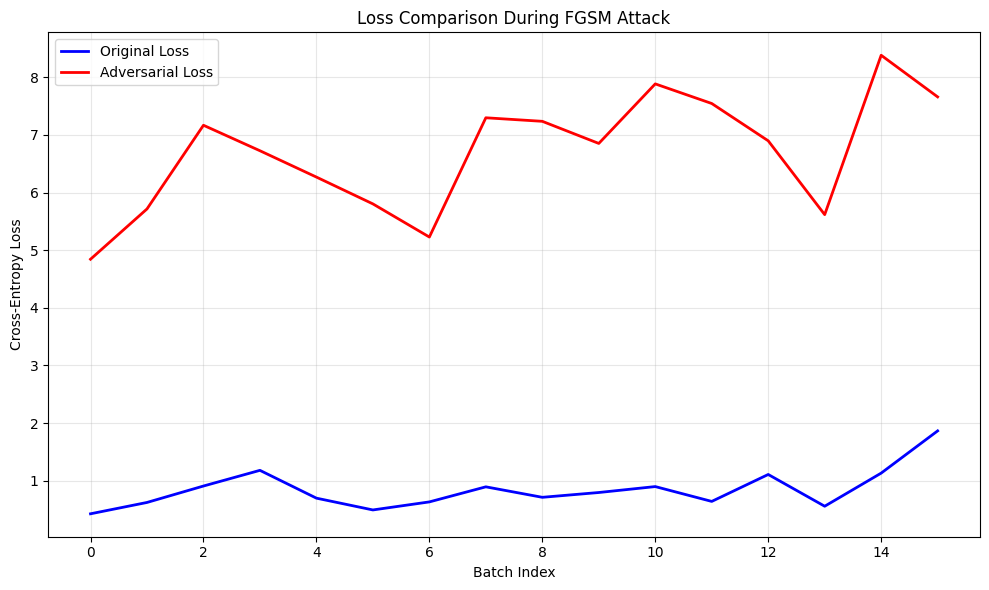

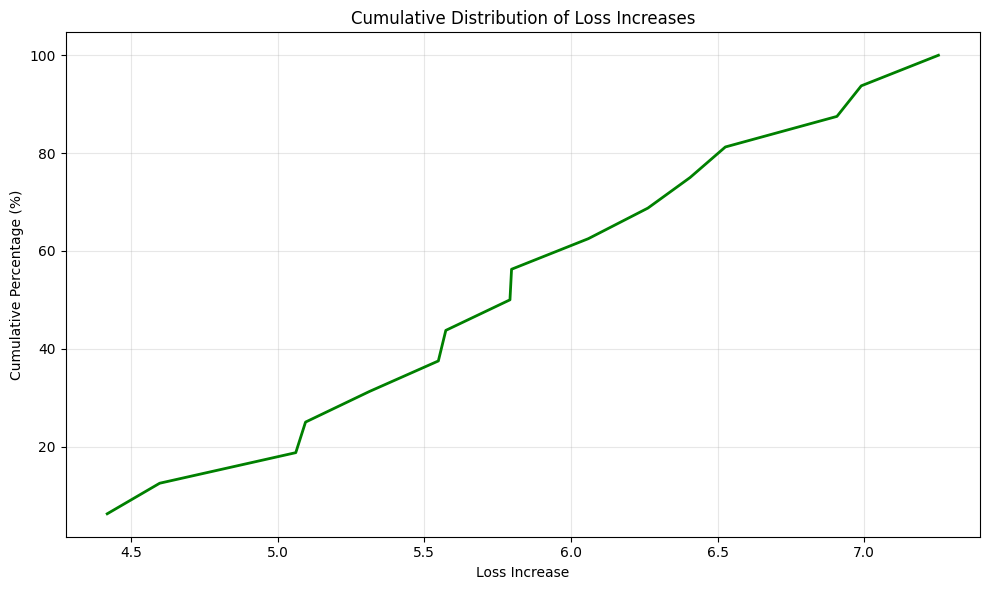


=== Loss Statistics ===
Mean Original Loss: 0.8462
Mean Adversarial Loss: 6.6961
Loss Increase: 5.8499
Max Loss Increase: 7.2530

Loss analysis data saved to ./loss_analysis_data.npy

=== L∞ Distance Verification ===
Maximum L∞ distance: 0.0200
Mean L∞ distance: 0.0200
All examples within ε=0.02 constraint: True

=== FGSM Attack Results (ε = 0.02) ===
Original Top-1 Accuracy: 76.00%
Adversarial Top-1 Accuracy: 6.20%
Top-1 Accuracy Drop: 69.80%

Original Top-5 Accuracy: 94.20%
Adversarial Top-5 Accuracy: 35.60%
Top-5 Accuracy Drop: 58.60%


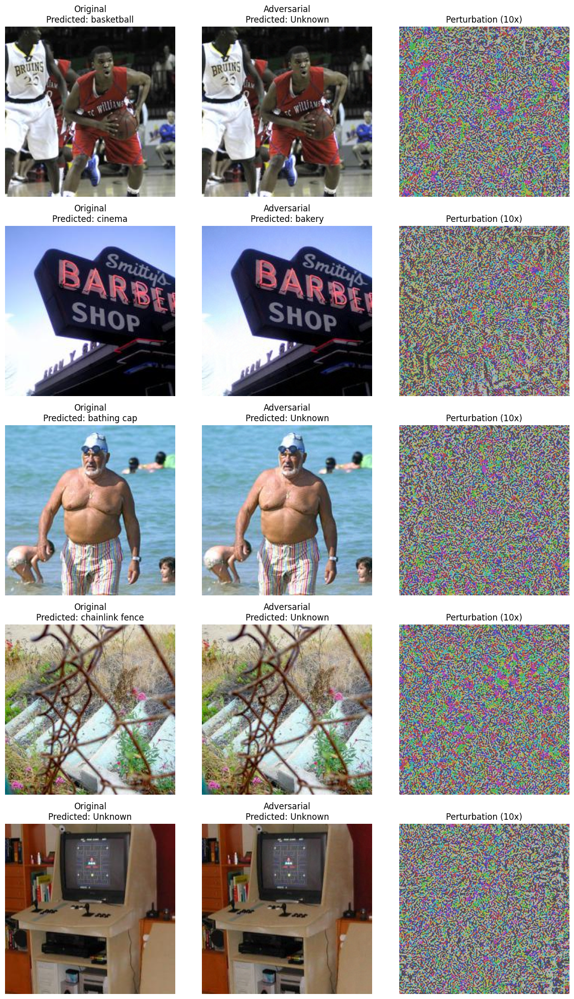

In [6]:
# Task 2: Implement FGSM Attack with ε = 0.02 and Loss Plotting
import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os

# FGSM Attack Implementation
def fgsm_attack(image, epsilon, data_grad):
    """
    FGSM attack implementation
    Args:
        image: input image tensor
        epsilon: attack budget
        data_grad: gradient of the loss w.r.t input image
    Returns:
        perturbed_image: adversarial example
    """
    # Collect the sign of data gradient
    sign_data_grad = data_grad.sign()

    # Create the adversarial image by adding epsilon*sign to the original image
    perturbed_image = image + epsilon * sign_data_grad

    # Make sure we don't go outside the valid range for normalized images
    perturbed_image = torch.clamp(perturbed_image, image.min(), image.max())

    return perturbed_image

# Function to generate adversarial examples for the entire dataset with loss tracking
def generate_adversarial_dataset_with_loss_tracking(model, data_loader, epsilon=0.02):
    """
    Generate adversarial examples for the entire dataset using FGSM
    and track losses before and after attack
    """
    model.eval()

    # Create mapping from folder index to ImageNet index
    folder_to_imagenet = {}
    for label_entry in labels_list:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        folder_idx = imagenet_idx - 401
        folder_to_imagenet[folder_idx] = imagenet_idx

    adversarial_examples = []
    original_images = []
    true_labels = []
    predicted_labels = []
    adv_predicted_labels = []

    # Track losses for plotting
    original_losses = []
    adversarial_losses = []
    batch_indices = []

    for batch_idx, (images, labels) in enumerate(tqdm(data_loader, desc="Generating adversarial examples")):
        images = images.to(device)
        labels = labels.to(device)

        # Map folder indices to ImageNet indices for loss calculation
        imagenet_labels = torch.tensor([folder_to_imagenet[label.item()] for label in labels]).to(device)

        # Set requires_grad attribute of tensor
        images.requires_grad = True

        # Forward pass the original image
        outputs = model(images)
        loss = F.cross_entropy(outputs, imagenet_labels)
        original_losses.append(loss.item())
        batch_indices.append(batch_idx)

        # Zero all existing gradients
        model.zero_grad()

        # Calculate gradients of model in backward pass
        loss.backward()

        # Collect datagrad
        data_grad = images.grad.data

        # Create adversarial examples
        perturbed_images = fgsm_attack(images, epsilon, data_grad)

        # Re-classify the perturbed image and calculate adversarial loss
        with torch.no_grad():
            perturbed_outputs = model(perturbed_images)
            adv_loss = F.cross_entropy(perturbed_outputs, imagenet_labels)
            adversarial_losses.append(adv_loss.item())

        # Store results
        adversarial_examples.extend(perturbed_images.detach().cpu().numpy())
        original_images.extend(images.detach().cpu().numpy())
        true_labels.extend(labels.cpu().numpy())
        predicted_labels.extend(outputs.argmax(dim=1).cpu().numpy())
        adv_predicted_labels.extend(perturbed_outputs.argmax(dim=1).cpu().numpy())

    return (adversarial_examples, original_images, true_labels, predicted_labels,
            adv_predicted_labels, original_losses, adversarial_losses, batch_indices)

# Generate adversarial examples with loss tracking
print("Generating FGSM adversarial examples with ε = 0.02...")
(adversarial_examples, original_images, true_labels, predicted_labels,
 adv_predicted_labels, original_losses, adversarial_losses, batch_indices) = generate_adversarial_dataset_with_loss_tracking(
    pretrained_model, data_loader, epsilon=0.02
)

# Convert to numpy arrays for easier manipulation
adversarial_examples = np.array(adversarial_examples)
original_images = np.array(original_images)

# Plot only Loss values over batches
plt.figure(figsize=(10, 6))
plt.plot(batch_indices, original_losses, 'b-', label='Original Loss', linewidth=2)
plt.plot(batch_indices, adversarial_losses, 'r-', label='Adversarial Loss', linewidth=2)
plt.xlabel('Batch Index')
plt.ylabel('Cross-Entropy Loss')
plt.title('Loss Comparison During FGSM Attack')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('./fgsm_loss_over_batches.png', dpi=150, bbox_inches='tight')
plt.show()

# Plot only Cumulative loss increase
loss_increases = np.array(adversarial_losses) - np.array(original_losses)
sorted_increases = np.sort(loss_increases)
cumulative_percent = np.arange(1, len(sorted_increases) + 1) / len(sorted_increases) * 100

plt.figure(figsize=(10, 6))
plt.plot(sorted_increases, cumulative_percent, 'g-', linewidth=2)
plt.xlabel('Loss Increase')
plt.ylabel('Cumulative Percentage (%)')
plt.title('Cumulative Distribution of Loss Increases')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.savefig('./cumulative_loss_increase.png', dpi=150, bbox_inches='tight')
plt.show()

# Calculate and print statistics
print(f"\n=== Loss Statistics ===")
print(f"Mean Original Loss: {np.mean(original_losses):.4f}")
print(f"Mean Adversarial Loss: {np.mean(adversarial_losses):.4f}")
print(f"Loss Increase: {np.mean(adversarial_losses) - np.mean(original_losses):.4f}")
print(f"Max Loss Increase: {np.max(np.array(adversarial_losses) - np.array(original_losses)):.4f}")

# Save loss data for later analysis
loss_data = {
    'original_losses': original_losses,
    'adversarial_losses': adversarial_losses,
    'batch_indices': batch_indices,
    'loss_increases': loss_increases
}

np.save('./loss_analysis_data.npy', loss_data)
print("\nLoss analysis data saved to ./loss_analysis_data.npy")

# Verify L∞ distance constraint
l_inf_distances = np.max(np.abs(adversarial_examples - original_images), axis=(1, 2, 3))
print(f"\n=== L∞ Distance Verification ===")
print(f"Maximum L∞ distance: {np.max(l_inf_distances):.4f}")
print(f"Mean L∞ distance: {np.mean(l_inf_distances):.4f}")
print(f"All examples within ε=0.02 constraint: {np.all(l_inf_distances <= 0.02 + 1e-6)}")

# Save adversarial dataset
adversarial_path = "/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet1"
os.makedirs(adversarial_path, exist_ok=True)
np.save(os.path.join(adversarial_path, "adversarial_images.npy"), adversarial_examples)
np.save(os.path.join(adversarial_path, "original_images.npy"), original_images)
np.save(os.path.join(adversarial_path, "true_labels.npy"), true_labels)

# Evaluate adversarial accuracy
adv_accuracy_top1, adv_accuracy_top5 = evaluate_adversarial_accuracy(
    pretrained_model, adversarial_examples, true_labels, labels_list
)

print(f"\n=== FGSM Attack Results (ε = 0.02) ===")
print(f"Original Top-1 Accuracy: {accuracy_top1:.2f}%")
print(f"Adversarial Top-1 Accuracy: {adv_accuracy_top1:.2f}%")
print(f"Top-1 Accuracy Drop: {accuracy_top1 - adv_accuracy_top1:.2f}%")
print(f"\nOriginal Top-5 Accuracy: {accuracy_top5:.2f}%")
print(f"Adversarial Top-5 Accuracy: {adv_accuracy_top5:.2f}%")
print(f"Top-5 Accuracy Drop: {accuracy_top5 - adv_accuracy_top5:.2f}%")

# Visualize 5 test cases
def visualize_adversarial_examples(original_images, adversarial_images, true_labels,
                                 predicted_labels, adv_predicted_labels, num_examples=5):
    fig, axes = plt.subplots(num_examples, 3, figsize=(12, 4*num_examples))

    # Denormalize function for visualization
    def denormalize(img):
        img_denorm = img.copy()
        img_denorm = img_denorm * std_norms.reshape(3, 1, 1) + mean_norms.reshape(3, 1, 1)
        img_denorm = np.clip(img_denorm.transpose(1, 2, 0), 0, 1)
        return img_denorm

    # Find examples where the attack was successful
    successful_attacks = []
    for i in range(len(true_labels)):
        if predicted_labels[i] != adv_predicted_labels[i]:
            successful_attacks.append(i)

    # Select random successful examples
    selected_indices = np.random.choice(successful_attacks, size=min(num_examples, len(successful_attacks)), replace=False)

    for idx, example_idx in enumerate(selected_indices):
        # Original image
        axes[idx, 0].imshow(denormalize(original_images[example_idx]))
        axes[idx, 0].set_title(f'Original\nPredicted: {label_map.get(predicted_labels[example_idx], "Unknown")}')
        axes[idx, 0].axis('off')

        # Adversarial image
        axes[idx, 1].imshow(denormalize(adversarial_images[example_idx]))
        axes[idx, 1].set_title(f'Adversarial\nPredicted: {label_map.get(adv_predicted_labels[example_idx], "Unknown")}')
        axes[idx, 1].axis('off')

        # Perturbation (amplified for visibility)
        perturbation = adversarial_images[example_idx] - original_images[example_idx]
        perturbation_vis = perturbation * 10 + 0.5  # Amplify and center
        axes[idx, 2].imshow(np.clip(perturbation_vis.transpose(1, 2, 0), 0, 1))
        axes[idx, 2].set_title('Perturbation (10x)')
        axes[idx, 2].axis('off')

    plt.tight_layout()
    plt.savefig('./fgsm_examples.png', dpi=150, bbox_inches='tight')
    plt.show()

# Create visualizations
visualize_adversarial_examples(original_images, adversarial_examples, true_labels,
                             predicted_labels, adv_predicted_labels)

# Task 3: Improved attacks

**Three attacks:**
*   PGD (Projected Gradient Descent) attack: Multiple gradient steps (10 steps) with iterative projection back to the L∞ ball
*   C&W-style attack: 50 optimization steps using Adam optimizer
*   Momentum attack: 20 steps with momentum accumulation

**Better transferability:**
*   Ensemble Approach for Better Transferability

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 215MB/s]


Generating improved adversarial examples with enhanced loss functions...


Generating ensemble adversarial examples:   0%|          | 0/16 [00:00<?, ?it/s]

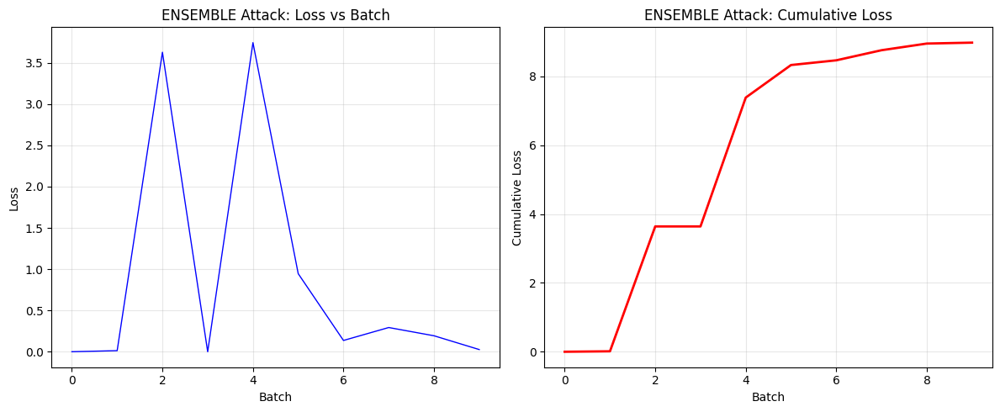

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:   6%|▋         | 1/16 [01:26<21:44, 87.00s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  12%|█▎        | 2/16 [02:52<20:05, 86.10s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  19%|█▉        | 3/16 [04:17<18:33, 85.65s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  25%|██▌       | 4/16 [05:43<17:09, 85.80s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  31%|███▏      | 5/16 [07:10<15:46, 86.07s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  38%|███▊      | 6/16 [08:36<14:21, 86.17s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  44%|████▍     | 7/16 [10:02<12:54, 86.06s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  50%|█████     | 8/16 [11:27<11:27, 85.88s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  56%|█████▋    | 9/16 [12:53<09:59, 85.71s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  62%|██████▎   | 10/16 [14:18<08:33, 85.66s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  69%|██████▉   | 11/16 [15:44<07:08, 85.71s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  75%|███████▌  | 12/16 [17:09<05:41, 85.41s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  81%|████████▏ | 13/16 [18:34<04:16, 85.47s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  88%|████████▊ | 14/16 [20:02<02:52, 86.17s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples:  94%|█████████▍| 15/16 [21:29<01:26, 86.26s/it]

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

Generating ensemble adversarial examples: 100%|██████████| 16/16 [22:23<00:00, 83.97s/it]


<Figure size 640x480 with 0 Axes>

Attack success rate: 91.00%
Average confidence reduction: 66.44%
Final loss: 4.7654
Average loss: 0.8217

L∞ distance verification:
Maximum L∞ distance: 0.0200
Mean L∞ distance: 0.0200
All examples within ε=0.02 constraint: True


In [7]:
# Task 3: Improved Adversarial Attacks with ε = 0.02
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import random

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load both models for ensemble attacks
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1').to(device)
densenet_model = torchvision.models.densenet121(weights='IMAGENET1K_V1').to(device)
pretrained_model.eval()
densenet_model.eval()

# Create model ensemble
model_ensemble = [pretrained_model, densenet_model]

# Add lists for loss tracking
batch_losses = []
cumulative_losses = []

# Enhanced Loss Functions
def margin_loss(outputs, true_labels, target_labels=None):
    """Margin-based loss for adversarial attacks"""
    batch_size = outputs.size(0)
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        # Targeted attack: maximize margin between target and true class
        target_class_logits = outputs[torch.arange(batch_size), target_labels]
        # We want: target_logits > true_logits by as much as possible
        return torch.mean(true_class_logits - target_class_logits)
    else:
        # Untargeted attack: minimize true class logit vs all others
        other_logits = outputs.clone()
        # Set true class logits to a very low value so they're ignored in the max operation
        other_logits[torch.arange(batch_size), true_labels] = -float('inf')
        # Get the highest non-true class logit
        best_other_logits = torch.max(other_logits, dim=1)[0]
        # We want: other_logits > true_logits by as much as possible
        return torch.mean(true_class_logits - best_other_logits)

def confidence_weighted_loss(outputs, true_labels, target_labels=None, kappa=20.0):
    """Loss weighted by model confidence in predictions"""
    probs = F.softmax(outputs, dim=1)
    batch_size = outputs.size(0)
    # Get confidence in true class
    true_class_confidence = probs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        # Targeted: maximize target confidence, minimize true confidence
        target_class_confidence = probs[torch.arange(batch_size), target_labels]
        # Weight by how confident the model is in the true class
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean((true_class_confidence - target_class_confidence) * confidence_weights * kappa)
    else:
        # Untargeted: minimize true confidence
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean(true_class_confidence * confidence_weights * kappa)

def entropy_loss(outputs, true_labels, target_labels=None, lambda_entropy=0.5):
    """Entropy-based loss for creating uncertain predictions"""
    standard_loss = F.cross_entropy(outputs, true_labels)
    # Calculate entropy of the softmax distribution
    probs = F.softmax(outputs, dim=1)
    log_probs = F.log_softmax(outputs, dim=1)
    entropy = -torch.sum(probs * log_probs, dim=1).mean()

    if target_labels is not None:
        # For targeted attacks, we want to minimize entropy for target class
        target_loss = -F.cross_entropy(outputs, target_labels)
        return target_loss - lambda_entropy * entropy
    else:
        # For untargeted attacks, maximize entropy (uncertainty)
        return standard_loss - lambda_entropy * entropy

def multi_target_loss(outputs, true_labels, num_targets=3):
    """Attack multiple alternative classes simultaneously"""
    batch_size = outputs.size(0)
    num_classes = outputs.size(1)
    # Get the logits for the true class
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    # Create a mask to exclude the true class when finding top targets
    mask = torch.ones((batch_size, num_classes), device=outputs.device)
    mask[torch.arange(batch_size), true_labels] = 0

    # Find the top-k most likely incorrect classes
    masked_outputs = outputs * mask - (1 - mask) * 10000.0  # Large negative for true class
    _, target_indices = torch.topk(masked_outputs, num_targets, dim=1)

    # Calculate the margin loss for each target class
    total_loss = 0
    for i in range(num_targets):
        target_logits = outputs[torch.arange(batch_size), target_indices[:, i]]
        total_loss += torch.mean(true_class_logits - target_logits)

    return total_loss / num_targets

# Improved Attack 1: PGD with Enhanced Loss
def pgd_attack(image, target_label, model, epsilon=0.02, alpha=0.01, num_steps=10,
               use_margin=True, use_confidence=False, use_entropy=False):
    """
    Enhanced PGD attack implementation with multiple loss functions
    """
    perturbed_image = image.clone().detach()
    perturbed_image.requires_grad = True
    original_image = image.clone().detach()

    # Check if model is ensemble
    is_ensemble = isinstance(model, list)

    for _ in range(num_steps):
        # Forward pass
        if is_ensemble:
            # Ensemble attack: average gradients from all models
            loss_total = 0
            for m in model:
                outputs = m(perturbed_image)

                # Combine different loss functions
                if use_margin:
                    loss_total += margin_loss(outputs, target_label)
                if use_confidence:
                    loss_total += confidence_weighted_loss(outputs, target_label)
                if use_entropy:
                    loss_total += entropy_loss(outputs, target_label)

                if not (use_margin or use_confidence or use_entropy):
                    loss_total += F.cross_entropy(outputs, target_label)

            loss = loss_total / len(model)
        else:
            outputs = model(perturbed_image)

            # Combine different loss functions
            loss = 0
            if use_margin:
                loss += margin_loss(outputs, target_label)
            if use_confidence:
                loss += confidence_weighted_loss(outputs, target_label)
            if use_entropy:
                loss += entropy_loss(outputs, target_label)

            if loss == 0:  # Fallback to standard cross-entropy
                loss = F.cross_entropy(outputs, target_label)

        # Zero gradients
        if is_ensemble:
            for m in model:
                m.zero_grad()
        else:
            model.zero_grad()

        # Backward pass
        loss.backward()

        # Update adversarial image
        with torch.no_grad():
            # Take a gradient step
            perturbed_image = perturbed_image + alpha * perturbed_image.grad.sign()

            # Project back to L_inf ball
            perturbation = torch.clamp(perturbed_image - original_image, -epsilon, epsilon)
            perturbed_image = original_image + perturbation

            # Clamp to valid image range
            perturbed_image = torch.clamp(perturbed_image, original_image.min(), original_image.max())

        perturbed_image.requires_grad = True

    return perturbed_image.detach()

# Improved Attack 2: C&W with Multi-Target Loss
def cw_linf_attack(image, target_label, model, epsilon=0.02, num_steps=20, c=1.0, lr=0.01,
                   use_multi_target=True):
    """
    Enhanced C&W style attack with multi-target loss
    """
    perturbation = torch.zeros_like(image).to(device)
    perturbation.requires_grad = True

    # Use Adam optimizer for better convergence
    optimizer = optim.Adam([perturbation], lr=lr)

    # Check if model is ensemble
    is_ensemble = isinstance(model, list)

    for _ in range(num_steps):
        # Create adversarial image
        adv_image = image + perturbation

        # Forward pass and loss calculation
        if is_ensemble:
            # Ensemble attack: average losses from all models
            loss_total = 0
            for m in model:
                outputs = m(adv_image)

                if use_multi_target:
                    # Multi-target loss
                    loss_total += multi_target_loss(outputs, target_label)
                else:
                    # Standard C&W loss
                    correct_logit = outputs.gather(1, target_label.unsqueeze(1))
                    wrong_logits = torch.max(outputs - 1000 * F.one_hot(target_label, outputs.shape[1]), dim=1)[0]
                    loss_total += c * torch.relu(correct_logit - wrong_logits + 50).mean()

            loss = loss_total / len(model)
        else:
            outputs = model(adv_image)

            if use_multi_target:
                # Multi-target loss
                loss = multi_target_loss(outputs, target_label)
            else:
                # Standard C&W loss
                correct_logit = outputs.gather(1, target_label.unsqueeze(1))
                wrong_logits = torch.max(outputs - 1000 * F.one_hot(target_label, outputs.shape[1]), dim=1)[0]
                loss = c * torch.relu(correct_logit - wrong_logits + 50).mean()

        # Optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Project to L_inf ball
        with torch.no_grad():
            perturbation.data = torch.clamp(perturbation.data, -epsilon, epsilon)

    # Final adversarial image
    adv_image = image + perturbation
    adv_image = torch.clamp(adv_image, image.min(), image.max())

    return adv_image.detach()

# Improved Attack 3: Momentum with Entropy Maximization
def momentum_targeted_attack(image, source_label, target_label, model, epsilon=0.02,
                           num_steps=5, decay=0.9, alpha=0.01, use_entropy=True):
    """
    Enhanced targeted attack using momentum with entropy maximization
    """
    perturbed_image = image.clone().detach()
    momentum = torch.zeros_like(image).to(device)

    # Check if model is ensemble
    is_ensemble = isinstance(model, list)

    for _ in range(num_steps):
        perturbed_image.requires_grad = True

        # Forward pass and loss calculation
        if is_ensemble:
            # Ensemble attack: average losses from all models
            loss_total = 0
            for m in model:
                outputs = m(perturbed_image)

                if use_entropy:
                    # Use entropy loss for targeted attack
                    loss_total += entropy_loss(outputs, source_label, target_label)
                else:
                    # Standard targeted loss
                    loss_total += -F.cross_entropy(outputs, target_label)

            loss = loss_total / len(model)
        else:
            outputs = model(perturbed_image)

            if use_entropy:
                # Use entropy loss for targeted attack
                loss = entropy_loss(outputs, source_label, target_label)
            else:
                # Standard targeted loss
                loss = -F.cross_entropy(outputs, target_label)

        # Backward pass
        if is_ensemble:
            for m in model:
                m.zero_grad()
        else:
            model.zero_grad()
        loss.backward()

        # Update with momentum
        with torch.no_grad():
            # Accumulate momentum
            grad = perturbed_image.grad.data
            momentum = decay * momentum + grad / torch.norm(grad, p=1)

            # Update image
            perturbed_image = perturbed_image - alpha * momentum.sign()

            # Project to L_inf ball
            perturbation = torch.clamp(perturbed_image - image, -epsilon, epsilon)
            perturbed_image = image + perturbation

            # Clamp to valid range
            perturbed_image = torch.clamp(perturbed_image, image.min(), image.max())

    return perturbed_image.detach()

# Combined attack strategy: ensemble of enhanced methods
def ensemble_attack(image, label, model, epsilon=0.02):
    """
    Enhanced ensemble attack combining multiple strategies with improved losses
    """
    # Generate random target for targeted attacks
    num_classes = 1000
    target_label = torch.randint(0, num_classes, (1,)).to(device)
    while target_label == label:
        target_label = torch.randint(0, num_classes, (1,)).to(device)

    # Try different enhanced attacks
    attacks = []

    # PGD with margin loss and confidence weighting
    pgd_adv = pgd_attack(image.unsqueeze(0), label.unsqueeze(0), model,
                         use_margin=True, use_confidence=True)
    attacks.append(pgd_adv)

    # C&W with multi-target loss
    cw_adv = cw_linf_attack(image.unsqueeze(0), label.unsqueeze(0), model,
                            use_multi_target=True)
    attacks.append(cw_adv)

    # Targeted momentum attack with entropy
    momentum_adv = momentum_targeted_attack(image.unsqueeze(0), label.unsqueeze(0),
                                          target_label, model, use_entropy=True)
    attacks.append(momentum_adv)

    # Evaluate which attack is most effective against the primary model
    best_attack = None
    lowest_confidence = float('inf')

    # Evaluate against the primary model (ResNet-34)
    primary_model = pretrained_model if not isinstance(model, list) else model[0]

    with torch.no_grad():
        for attack in attacks:
            outputs = primary_model(attack)
            probs = F.softmax(outputs, dim=1)
            correct_confidence = probs[0, label].item()

            # Also consider entropy for uncertainty
            log_probs = F.log_softmax(outputs, dim=1)
            entropy = -torch.sum(probs * log_probs, dim=1).item()

            # Combine confidence and entropy metrics
            attack_score = correct_confidence - 0.1 * entropy

            if attack_score < lowest_confidence:
                lowest_confidence = attack_score
                best_attack = attack

    return best_attack.squeeze(0)

# Main function to generate improved adversarial dataset
def generate_improved_adversarial_dataset(model, data_loader, epsilon=0.02, attack_type='pgd'):
    """
    Generate adversarial examples using improved attacks with enhanced loss functions
    """
    # Set models to eval mode
    if isinstance(model, list):
        for m in model:
            m.eval()
    else:
        model.eval()

    # Create mapping from folder index to ImageNet index
    folder_to_imagenet = {}
    for label_entry in labels_list:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        folder_idx = imagenet_idx - 401
        folder_to_imagenet[folder_idx] = imagenet_idx

    adversarial_examples = []
    original_images = []
    true_labels = []
    attack_success_count = 0
    confidence_reduction_sum = 0

    # Use primary model for success evaluation
    primary_model = pretrained_model

    # Initialize plot
    plt.ion()
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 5))

    # Reset loss tracking lists
    batch_losses.clear()
    cumulative_losses.clear()
    current_cumulative = 0
    batch_idx = 0

    for images, labels in tqdm(data_loader, desc=f"Generating {attack_type} adversarial examples"):
        batch_size = images.shape[0]

        for i in range(batch_size):
            image = images[i].unsqueeze(0).to(device)
            label = labels[i].to(device)

            # Map to ImageNet label
            imagenet_label = torch.tensor([folder_to_imagenet[label.item()]]).to(device)

            # Get original confidence
            with torch.no_grad():
                orig_outputs = primary_model(image)
                orig_probs = F.softmax(orig_outputs, dim=1)
                orig_confidence = orig_probs[0, imagenet_label].item()

            # Calculate and store loss for this batch
            loss_value = 0

            # Apply attack based on type
            if attack_type == 'pgd':
                adv_image = pgd_attack(image, imagenet_label, model, epsilon=epsilon,
                                       use_margin=True, use_confidence=True, use_entropy=True)
                # Calculate loss for plotting
                outputs = primary_model(image)
                loss_value = margin_loss(outputs, imagenet_label).item()
            elif attack_type == 'cw':
                adv_image = cw_linf_attack(image, imagenet_label, model, epsilon=epsilon,
                                           use_multi_target=True)
                # Calculate loss for plotting
                outputs = primary_model(image)
                loss_value = multi_target_loss(outputs, imagenet_label).item()
            elif attack_type == 'momentum':
                # Random target for momentum attack
                target = torch.randint(0, 1000, (1,)).to(device)
                while target == imagenet_label:
                    target = torch.randint(0, 1000, (1,)).to(device)
                adv_image = momentum_targeted_attack(image, imagenet_label, target, model,
                                                   use_entropy=True)
                # Calculate loss for plotting
                outputs = primary_model(image)
                loss_value = entropy_loss(outputs, imagenet_label, target).item()
            else:  # ensemble
                adv_image = ensemble_attack(images[i].to(device), imagenet_label[0], model)
                adv_image = adv_image.unsqueeze(0)
                # Calculate loss for plotting
                outputs = primary_model(image)
                loss_value = F.cross_entropy(outputs, imagenet_label).item()

            # Update loss tracking
            batch_losses.append(loss_value)
            current_cumulative += loss_value
            cumulative_losses.append(current_cumulative)
            batch_idx += 1

            # Update plots every 10 batches
            if batch_idx % 10 == 0:
                ax1.clear()
                ax2.clear()

                # Plot loss vs batch
                ax1.plot(batch_losses, 'b-', linewidth=1)
                ax1.set_xlabel('Batch')
                ax1.set_ylabel('Loss')
                ax1.set_title(f'{attack_type.upper()} Attack: Loss vs Batch')
                ax1.grid(True, alpha=0.3)

                # Plot cumulative loss
                ax2.plot(cumulative_losses, 'r-', linewidth=2)
                ax2.set_xlabel('Batch')
                ax2.set_ylabel('Cumulative Loss')
                ax2.set_title(f'{attack_type.upper()} Attack: Cumulative Loss')
                ax2.grid(True, alpha=0.3)

                plt.tight_layout()
                plt.pause(0.01)

            # Verify attack success against primary model
            with torch.no_grad():
                orig_pred = primary_model(image).argmax(dim=1)
                adv_outputs = primary_model(adv_image)
                adv_pred = adv_outputs.argmax(dim=1)
                adv_probs = F.softmax(adv_outputs, dim=1)
                adv_confidence = adv_probs[0, imagenet_label].item()

                if orig_pred != adv_pred:
                    attack_success_count += 1

                confidence_reduction_sum += (orig_confidence - adv_confidence)

            adversarial_examples.append(adv_image.squeeze(0).cpu().numpy())
            original_images.append(image.squeeze(0).cpu().numpy())
            true_labels.append(label.cpu().numpy())

    # Final plot update
    ax1.clear()
    ax2.clear()

    ax1.plot(batch_losses, 'b-', linewidth=1)
    ax1.set_xlabel('Batch')
    ax1.set_ylabel('Loss')
    ax1.set_title(f'{attack_type.upper()} Attack: Final Loss vs Batch')
    ax1.grid(True, alpha=0.3)

    ax2.plot(cumulative_losses, 'r-', linewidth=2)
    ax2.set_xlabel('Batch')
    ax2.set_ylabel('Cumulative Loss')
    ax2.set_title(f'{attack_type.upper()} Attack: Final Cumulative Loss')
    ax2.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig(f'{attack_type}_loss_plots.png', dpi=300, bbox_inches='tight')
    plt.ioff()
    plt.show()

    avg_confidence_reduction = confidence_reduction_sum / len(true_labels)

    print(f"Attack success rate: {attack_success_count / len(true_labels) * 100:.2f}%")
    print(f"Average confidence reduction: {avg_confidence_reduction * 100:.2f}%")
    print(f"Final loss: {batch_losses[-1]:.4f}")
    print(f"Average loss: {np.mean(batch_losses):.4f}")

    return adversarial_examples, original_images, true_labels

# Generate adversarial examples using ensemble approach with enhanced losses
print("Generating improved adversarial examples with enhanced loss functions...")
adversarial_examples, original_images, true_labels = generate_improved_adversarial_dataset(
    model_ensemble, data_loader, epsilon=0.02, attack_type='ensemble'
)

# Convert to numpy arrays
adversarial_examples = np.array(adversarial_examples)
original_images = np.array(original_images)
true_labels = np.array(true_labels)

# Verify L∞ distance constraint
l_inf_distances = np.max(np.abs(adversarial_examples - original_images), axis=(1, 2, 3))
print(f"\nL∞ distance verification:")
print(f"Maximum L∞ distance: {np.max(l_inf_distances):.4f}")
print(f"Mean L∞ distance: {np.mean(l_inf_distances):.4f}")
print(f"All examples within ε=0.02 constraint: {np.all(l_inf_distances <= 0.02 + 1e-6)}")

# Save Adversarial Test Set 2
adversarial_path_2 = "/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet2"
os.makedirs(adversarial_path_2, exist_ok=True)
np.save(os.path.join(adversarial_path_2, "adversarial_images.npy"), adversarial_examples)
np.save(os.path.join(adversarial_path_2, "original_images.npy"), original_images)
np.save(os.path.join(adversarial_path_2, "true_labels.npy"), true_labels)


=== Evaluation on ResNet-34 ===

=== Improved Attack Results (ε = 0.02) ===
ResNet-34:
Original Top-1 Accuracy: 76.00%
FGSM Adversarial Top-1 Accuracy: 6.00%
Improved Adversarial Top-1 Accuracy: 0.00%
Total Top-1 Accuracy Drop: 76.00%
Improved Adversarial Top-5 Accuracy: 0.20%
Total Top-5 Accuracy Drop: 94.00%


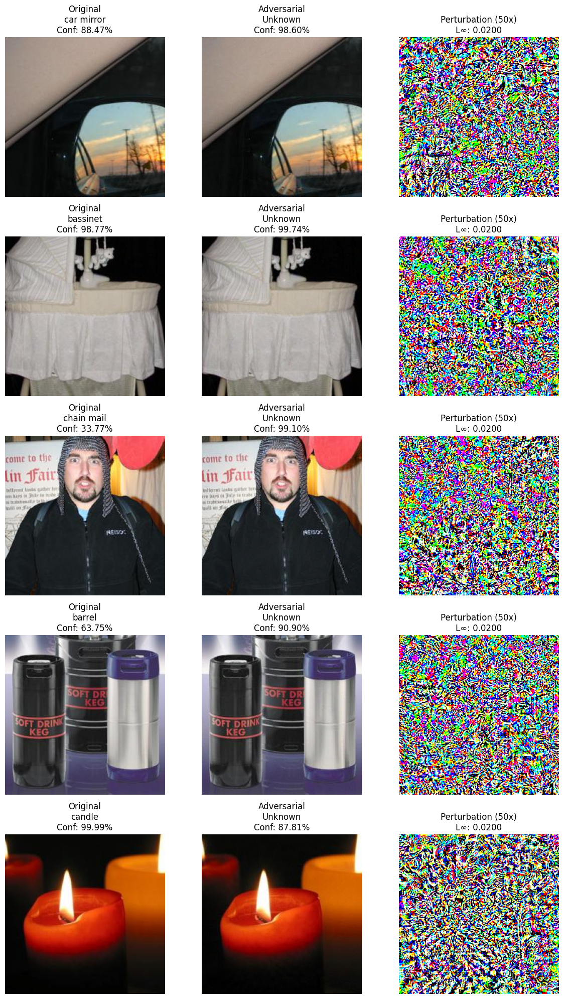

In [ ]:

# Evaluate adversarial accuracy
print("\n=== Evaluation on ResNet-34 ===")
improved_adv_accuracy_top1_resnet, improved_adv_accuracy_top5_resnet = evaluate_adversarial_accuracy(
    pretrained_model, adversarial_examples, true_labels, labels_list
)

# print("\n=== Evaluation on DenseNet-121 ===")
# improved_adv_accuracy_top1_densenet, improved_adv_accuracy_top5_densenet = evaluate_adversarial_accuracy(
#     densenet_model, adversarial_examples, true_labels, labels_list
# )

print(f"\n=== Improved Attack Results (ε = 0.02) ===")
print(f"ResNet-34:")
print(f"Original Top-1 Accuracy: {accuracy_top1:.2f}%")
print(f"FGSM Adversarial Top-1 Accuracy: {adv_accuracy_top1:.2f}%")
print(f"Improved Adversarial Top-1 Accuracy: {improved_adv_accuracy_top1_resnet:.2f}%")
print(f"Total Top-1 Accuracy Drop: {accuracy_top1 - improved_adv_accuracy_top1_resnet:.2f}%")
print(f"Improved Adversarial Top-5 Accuracy: {improved_adv_accuracy_top5_resnet:.2f}%")
print(f"Total Top-5 Accuracy Drop: {accuracy_top5 - improved_adv_accuracy_top5_resnet:.2f}%")
# print(f"\nDenseNet-121:")
# print(f"Improved Adversarial Top-1 Accuracy: {improved_adv_accuracy_top1_densenet:.2f}%")
# print(f"Transferability: Attack designed for ResNet-34 achieves {improved_adv_accuracy_top1_densenet:.2f}% on DenseNet-121")

# Visualization function (enhanced)
def visualize_improved_attacks(original_images, adversarial_images, true_labels,
                             model, num_examples=5):
    fig, axes = plt.subplots(num_examples, 3, figsize=(12, 4*num_examples))

    # Denormalize function
    def denormalize(img):
        img_denorm = img.copy()
        img_denorm = img_denorm * std_norms.reshape(3, 1, 1) + mean_norms.reshape(3, 1, 1)
        img_denorm = np.clip(img_denorm.transpose(1, 2, 0), 0, 1)
        return img_denorm

    # Select random examples
    indices = np.random.choice(len(original_images), size=num_examples, replace=False)

    with torch.no_grad():
        for idx, example_idx in enumerate(indices):
            # Original image
            orig_img = torch.tensor(original_images[example_idx]).unsqueeze(0).to(device)
            orig_outputs = model(orig_img)
            orig_probs = F.softmax(orig_outputs, dim=1)
            orig_pred = orig_outputs.argmax(dim=1).item()
            orig_conf = orig_probs[0, orig_pred].item()

            axes[idx, 0].imshow(denormalize(original_images[example_idx]))
            axes[idx, 0].set_title(f'Original\n{label_map.get(orig_pred, "Unknown")}\nConf: {orig_conf:.2%}')
            axes[idx, 0].axis('off')

            # Adversarial image
            adv_img = torch.tensor(adversarial_images[example_idx]).unsqueeze(0).to(device)
            adv_outputs = model(adv_img)
            adv_probs = F.softmax(adv_outputs, dim=1)
            adv_pred = adv_outputs.argmax(dim=1).item()
            adv_conf = adv_probs[0, adv_pred].item()

            axes[idx, 1].imshow(denormalize(adversarial_images[example_idx]))
            axes[idx, 1].set_title(f'Adversarial\n{label_map.get(adv_pred, "Unknown")}\nConf: {adv_conf:.2%}')
            axes[idx, 1].axis('off')

            # Perturbation (amplified)
            perturbation = adversarial_images[example_idx] - original_images[example_idx]
            perturbation_vis = perturbation * 50 + 0.5  # Amplify more for better visibility
            axes[idx, 2].imshow(np.clip(perturbation_vis.transpose(1, 2, 0), 0, 1))
            axes[idx, 2].set_title(f'Perturbation (50x)\nL∞: {np.max(np.abs(perturbation)):.4f}')
            axes[idx, 2].axis('off')

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/ECE7123DL/improved_attack_examples.png', dpi=150, bbox_inches='tight')
    plt.show()

# Create visualizations
visualize_improved_attacks(original_images, adversarial_examples, true_labels, pretrained_model)

# Task 4 patch
*   Salient Region Detection with GradCAM
*   Adaptive step size
*   Ensemble Gradient Averaging


Generating patch adversarial examples with enhanced loss functions...
Generating patch adversarial examples (patch_size=32, epsilon=0.5)...


100%|██████████| 16/16 [12:35<00:00, 47.23s/it]



Patch attack results:
Attack success rate: 60.80%
Average confidence reduction: 51.17%


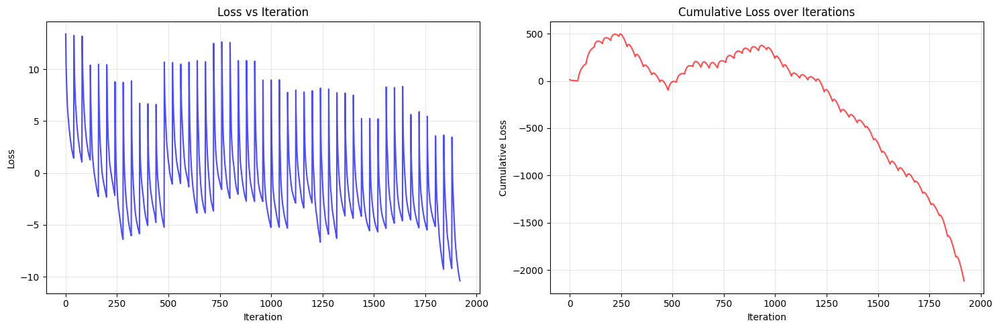


Patch constraint verification:
Patch size: 32x32 pixels
Epsilon (L∞ within patch): 0.5
Total examples generated: 500

Adversarial Test Set 3 saved to: /content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet3

Visualizing patch adversarial examples...


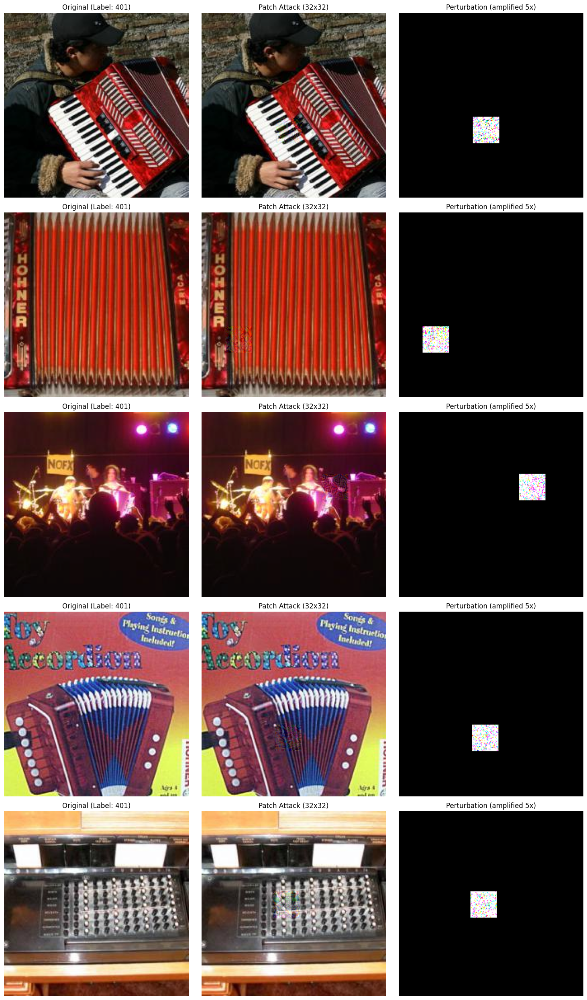

In [8]:
# Task 4: Patch Attacks with Advanced Optimizations from Task 3
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
import torchvision
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
import os
import random
import cv2

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load models for ensemble attacks (from Task 3)
pretrained_model = torchvision.models.resnet34(weights='IMAGENET1K_V1').to(device)
densenet_model = torchvision.models.densenet121(weights='IMAGENET1K_V1').to(device)
pretrained_model.eval()
densenet_model.eval()

# Create model ensemble
model_ensemble = [pretrained_model, densenet_model]

# Import loss functions from Task 3
def margin_loss(outputs, true_labels, target_labels=None):
    """Margin-based loss for adversarial attacks"""
    batch_size = outputs.size(0)
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        # Targeted attack: maximize margin between target and true class
        target_class_logits = outputs[torch.arange(batch_size), target_labels]
        return torch.mean(true_class_logits - target_class_logits)
    else:
        # Untargeted attack: minimize true class logit vs all others
        other_logits = outputs.clone()
        other_logits[torch.arange(batch_size), true_labels] = -float('inf')
        best_other_logits = torch.max(other_logits, dim=1)[0]
        return torch.mean(true_class_logits - best_other_logits)

def confidence_weighted_loss(outputs, true_labels, target_labels=None, kappa=20.0):
    """Loss weighted by model confidence in predictions"""
    probs = F.softmax(outputs, dim=1)
    batch_size = outputs.size(0)
    true_class_confidence = probs[torch.arange(batch_size), true_labels]

    if target_labels is not None:
        target_class_confidence = probs[torch.arange(batch_size), target_labels]
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean((true_class_confidence - target_class_confidence) * confidence_weights * kappa)
    else:
        confidence_weights = torch.pow(true_class_confidence, 2)
        return torch.mean(true_class_confidence * confidence_weights * kappa)

def entropy_loss(outputs, true_labels, target_labels=None, lambda_entropy=0.5):
    """Entropy-based loss for creating uncertain predictions"""
    standard_loss = F.cross_entropy(outputs, true_labels)
    probs = F.softmax(outputs, dim=1)
    log_probs = F.log_softmax(outputs, dim=1)
    entropy = -torch.sum(probs * log_probs, dim=1).mean()

    if target_labels is not None:
        target_loss = -F.cross_entropy(outputs, target_labels)
        return target_loss - lambda_entropy * entropy
    else:
        return standard_loss - lambda_entropy * entropy

def multi_target_loss(outputs, true_labels, num_targets=3):
    """Attack multiple alternative classes simultaneously"""
    batch_size = outputs.size(0)
    num_classes = outputs.size(1)
    true_class_logits = outputs[torch.arange(batch_size), true_labels]

    mask = torch.ones((batch_size, num_classes), device=outputs.device)
    mask[torch.arange(batch_size), true_labels] = 0

    masked_outputs = outputs * mask - (1 - mask) * 10000.0
    _, target_indices = torch.topk(masked_outputs, num_targets, dim=1)

    total_loss = 0
    for i in range(num_targets):
        target_logits = outputs[torch.arange(batch_size), target_indices[:, i]]
        total_loss += torch.mean(true_class_logits - target_logits)

    return total_loss / num_targets

# Grad-CAM implementation for salient region detection
def compute_gradcam(model, image, true_label, device='cuda'):
    """
    Computes Grad-CAM for an image to identify salient regions.
    """
    model.eval()

    # For ResNet, find the last convolutional layer
    last_conv_layer = None
    for name, module in model.named_modules():
        if isinstance(module, torch.nn.Conv2d):
            last_conv_layer = (name, module)

    if last_conv_layer is None:
        print("Could not find convolutional layer in model")
        return np.ones((image.shape[2], image.shape[3]))

    layer_name, target_layer = last_conv_layer

    # Storage for activations and gradients
    activations = {}
    gradients = {}

    # Forward hook to get activations
    def forward_hook(module, input, output):
        activations['value'] = output.detach()

    # Backward hook to get gradients
    def backward_hook(module, grad_input, grad_output):
        gradients['value'] = grad_output[0].detach()

    # Register the hooks
    forward_handle = target_layer.register_forward_hook(forward_hook)
    backward_handle = target_layer.register_full_backward_hook(backward_hook)

    # Forward pass
    model.zero_grad()
    output = model(image)

    # We only want the gradient with respect to the true class
    one_hot = torch.zeros_like(output)
    one_hot[0, true_label] = 1

    # Backward pass
    output.backward(gradient=one_hot, retain_graph=True)

    # Get activations and gradients
    activations = activations['value']
    gradients = gradients['value']

    # Remove the hooks
    forward_handle.remove()
    backward_handle.remove()

    # Calculate importance weights
    weights = torch.mean(gradients, dim=(2, 3), keepdim=True)

    # Generate weighted activations
    cam = torch.sum(weights * activations, dim=1, keepdim=True)

    # Apply ReLU
    cam = torch.relu(cam)

    # Normalize
    if torch.max(cam) > 0:
        cam = cam / torch.max(cam)

    # Resize to input resolution
    cam = cam.squeeze().cpu().detach().numpy()

    # Resize to input image dimensions using OpenCV
    height, width = image.shape[2], image.shape[3]
    cam = cv2.resize(cam, (width, height))

    return cam

def find_salient_patch_position(model, image, true_label, patch_size=32, device='cuda'):
    """
    Finds the most salient region in the image for placing the patch.
    """
    try:
        # Get Grad-CAM heatmap
        heatmap = compute_gradcam(model, image.unsqueeze(0), true_label, device)

        # Find the optimal patch position using sliding window
        height, width = heatmap.shape
        max_sum = -float('inf')
        optimal_position = (0, 0)

        # Ensure patch fits within image
        if height <= patch_size or width <= patch_size:
            return 0, 0

        # Slide the patch window over the heatmap
        for i in range(height - patch_size + 1):
            for j in range(width - patch_size + 1):
                window_sum = np.sum(heatmap[i:i+patch_size, j:j+patch_size])
                if window_sum > max_sum:
                    max_sum = window_sum
                    optimal_position = (i, j)

        return optimal_position

    except Exception as e:
        print(f"Error in salient region detection: {e}")
        # Fallback to random position
        if image.shape[1] <= patch_size or image.shape[2] <= patch_size:
            return 0, 0
        else:
            top = torch.randint(0, image.shape[1] - patch_size, (1,)).item()
            left = torch.randint(0, image.shape[2] - patch_size, (1,)).item()
            return top, left

# Initialize loss tracking lists
batch_losses = []
cumulative_losses = []

# Patch-based PGD with Task 3 optimizations
def patch_pgd_attack(model, images, labels, patch_size=32, epsilon=0.5, alpha=0.1,
                    num_iter=40, random_start=True, target=None, device='cuda',
                    use_adaptive_step=True, ensemble_size=3, use_salient=True,
                    use_margin=True, use_confidence=True, use_entropy=True):
    """
    Performs a patch-based PGD attack with advanced loss functions from Task 3.
    """

    # Clone the images
    perturbed_images = images.clone().detach()

    # Generate a mask for the patch
    batch_size, channels, height, width = images.shape

    # Tracking for best results in ensemble approach
    if target is not None and ensemble_size > 1:
        # Get initial predictions on clean images
        with torch.no_grad():
            initial_outputs = model[0](images) if isinstance(model, list) else model(images)
            _, initial_top5 = torch.topk(initial_outputs, 5, dim=1)

        # Track best adversarial examples
        best_adv_images = None
        best_confidences = torch.ones(images.size(0)).to(device) * float('inf')

        # Try different targets and patch positions
        for e in range(ensemble_size):
            # Generate patch positions for each image in the batch
            patch_masks = []
            for i in range(batch_size):
                try:
                    if use_salient:
                        # Find salient region for patch placement
                        primary_model = model[0] if isinstance(model, list) else model
                        top, left = find_salient_patch_position(primary_model, images[i], labels[i], patch_size, device)
                    else:
                        # Random patch position
                        if height <= patch_size or width <= patch_size:
                            top = 0
                            left = 0
                        else:
                            top = torch.randint(0, height - patch_size, (1,)).item()
                            left = torch.randint(0, width - patch_size, (1,)).item()
                except Exception as e:
                    print(f"Error in patch position selection: {e}")
                    # Fallback to random position
                    if height <= patch_size or width <= patch_size:
                        top = 0
                        left = 0
                    else:
                        top = torch.randint(0, height - patch_size, (1,)).item()
                        left = torch.randint(0, width - patch_size, (1,)).item()

                # Create mask (1 for patch area, 0 elsewhere)
                mask = torch.zeros((channels, height, width), device=device)
                mask[:, top:top+patch_size, left:left+patch_size] = 1.0
                patch_masks.append(mask)

            # Stack masks for batch processing
            patch_masks = torch.stack(patch_masks)

            # Generate new random targets for this ensemble run
            if e == 0:
                # First run - use provided targets
                current_targets = target
            else:
                # Subsequent runs - generate new random targets
                with torch.no_grad():
                    # Get least likely classes for each image
                    current_targets = torch.zeros_like(labels)
                    for i in range(images.size(0)):
                        # Get probabilities
                        probs = torch.nn.functional.softmax(initial_outputs[i], dim=0)
                        # Set the true class and top-5 to have high probability
                        for k in range(5):
                            if initial_top5[i, k] == labels[i]:
                                continue
                            else:
                                probs[initial_top5[i, k]] = 1.0

                        # Choose a target different from the true label
                        _, indices = torch.sort(probs)
                        for idx in indices:
                            if idx.item() != labels[i].item():
                                current_targets[i] = idx
                                break

            # Run patch PGD with current targets and patch positions
            current_adv_images = _patch_pgd_single_run(model, images, labels, patch_masks, epsilon,
                                                      alpha, num_iter, random_start, current_targets,
                                                      device, use_adaptive_step, use_margin,
                                                      use_confidence, use_entropy)

            # Evaluate effectiveness
            with torch.no_grad():
                primary_model = model[0] if isinstance(model, list) else model
                current_outputs = primary_model(current_adv_images)
                current_confidences = torch.nn.functional.softmax(current_outputs, dim=1)

                # Get confidence in true class
                true_class_confidences = torch.zeros(images.size(0))
                for i in range(images.size(0)):
                    true_class_confidences[i] = current_confidences[i, labels[i]].item()

                # Update best adversarial examples
                for i in range(images.size(0)):
                    if true_class_confidences[i] < best_confidences[i]:
                        if best_adv_images is None:
                            best_adv_images = current_adv_images.clone()
                        else:
                            best_adv_images[i] = current_adv_images[i].clone()
                        best_confidences[i] = true_class_confidences[i]

        return best_adv_images if best_adv_images is not None else current_adv_images
    else:
        # If not using ensemble, create a random patch mask for each image
        patch_masks = []
        for i in range(batch_size):
            # Random patch position
            if height <= patch_size or width <= patch_size:
                top = 0
                left = 0
            else:
                top = torch.randint(0, height - patch_size, (1,)).item()
                left = torch.randint(0, width - patch_size, (1,)).item()

            # Create mask
            mask = torch.zeros((channels, height, width), device=device)
            mask[:, top:top+patch_size, left:left+patch_size] = 1.0
            patch_masks.append(mask)

        # Stack masks for batch processing
        patch_masks = torch.stack(patch_masks)

        # Run PGD once
        return _patch_pgd_single_run(model, images, labels, patch_masks, epsilon, alpha,
                                    num_iter, random_start, target, device, use_adaptive_step,
                                    use_margin, use_confidence, use_entropy)

def _patch_pgd_single_run(model, images, labels, patch_masks, epsilon, alpha, num_iter,
                         random_start, target, device, use_adaptive_step,
                         use_margin=True, use_confidence=True, use_entropy=True):
    """Helper function to run a single PGD attack with patch constraints"""
    # Clone the images
    perturbed_images = images.clone().detach()

    # Check if model is ensemble
    is_ensemble = isinstance(model, list)

    # Start with random perturbation if specified
    if random_start:
        # Random perturbation within epsilon (only applied to patch area)
        random_noise = torch.FloatTensor(images.shape).uniform_(-epsilon, epsilon).to(device)
        random_noise = random_noise * patch_masks  # Only apply to patch area
        perturbed_images = perturbed_images + random_noise

        # Project back to valid image range
        for c in range(3):  # For each channel
            channel_min = (0 - mean_norms[c]) / std_norms[c]
            channel_max = (1 - mean_norms[c]) / std_norms[c]
            perturbed_images[:, c] = torch.clamp(perturbed_images[:, c], min=channel_min, max=channel_max)

    # List to track losses for this batch
    batch_iteration_losses = []

    # Iterate for num_iter iterations
    for i in range(num_iter):
        # Adaptive step size calculation
        if use_adaptive_step:
            # Gradually reduce step size for better convergence
            current_alpha = alpha * (1 - 0.75 * i / num_iter)
        else:
            current_alpha = alpha

        # Set requires_grad for perturbed images
        perturbed_images.requires_grad = True

        # Forward pass and loss calculation
        if is_ensemble:
            # Ensemble attack: average losses from all models
            loss_total = 0
            for m in model:
                outputs = m(perturbed_images)

                # Combine different loss functions from Task 3
                loss_components = 0
                if use_margin:
                    loss_components += margin_loss(outputs, labels, target)
                if use_confidence:
                    loss_components += confidence_weighted_loss(outputs, labels, target)
                if use_entropy:
                    loss_components += entropy_loss(outputs, labels, target)

                if loss_components == 0:  # Fallback
                    if target is not None:
                        loss_components = -F.cross_entropy(outputs, target)
                    else:
                        loss_components = F.cross_entropy(outputs, labels)

                loss_total += loss_components

            loss = loss_total / len(model)
        else:
            outputs = model(perturbed_images)

            # Combine different loss functions from Task 3
            loss = 0
            if use_margin:
                loss += margin_loss(outputs, labels, target)
            if use_confidence:
                loss += confidence_weighted_loss(outputs, labels, target)
            if use_entropy:
                loss += entropy_loss(outputs, labels, target)

            if loss == 0:  # Fallback
                if target is not None:
                    loss = -F.cross_entropy(outputs, target)
                else:
                    loss = F.cross_entropy(outputs, labels)

        # Store the loss value
        batch_iteration_losses.append(loss.item())

        # Backward pass
        if is_ensemble:
            for m in model:
                m.zero_grad()
        else:
            model.zero_grad()
        loss.backward()

        # Get the gradient sign
        with torch.no_grad():
            signed_grad = torch.sign(perturbed_images.grad.data)

            # Only update the pixels in the patch (apply mask to gradients)
            masked_grad = signed_grad * patch_masks

            # Update perturbed images with the step size
            if target is not None:
                # For targeted attack, move in negative gradient direction
                perturbed_images = perturbed_images - current_alpha * masked_grad
            else:
                # For untargeted attack, move in positive gradient direction
                perturbed_images = perturbed_images + current_alpha * masked_grad

            # Project back to epsilon ball around original images (only for patch area)
            delta = perturbed_images - images
            # Apply mask to delta to only constrain the patch area
            clamped_delta = torch.clamp(delta * patch_masks, min=-epsilon, max=epsilon)
            # For non-patch areas, delta should be zero
            delta = clamped_delta * patch_masks
            perturbed_images = images + delta

            # Project back to valid image range
            for c in range(3):  # For each channel
                channel_min = (0 - mean_norms[c]) / std_norms[c]
                channel_max = (1 - mean_norms[c]) / std_norms[c]
                perturbed_images[:, c] = torch.clamp(perturbed_images[:, c], min=channel_min, max=channel_max)

    # Add this batch's losses to global tracking
    batch_losses.extend(batch_iteration_losses)
    if len(cumulative_losses) == 0:
        cumulative_losses.extend(batch_iteration_losses)
    else:
        current_sum = cumulative_losses[-1]
        for loss in batch_iteration_losses:
            current_sum += loss
            cumulative_losses.append(current_sum)

    return perturbed_images

# Main function to generate patch adversarial dataset
def generate_patch_adversarial_dataset(model, data_loader, patch_size=32, epsilon=0.5,
                                      alpha=0.1, num_iter=40, random_start=True,
                                      targeted=True, device='cuda',
                                      use_adaptive_step=True, ensemble_size=3,
                                      use_salient=True):
    """
    Generate adversarial examples using patch-based attacks with Task 3 optimizations.
    """
    # Clear previous loss tracking
    global batch_losses, cumulative_losses
    batch_losses = []
    cumulative_losses = []

    # Set models to eval mode
    if isinstance(model, list):
        for m in model:
            m.eval()
    else:
        model.eval()

    # Create mapping from folder index to ImageNet index
    folder_to_imagenet = {}
    for label_entry in labels_list:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        folder_idx = imagenet_idx - 401
        folder_to_imagenet[folder_idx] = imagenet_idx

    adversarial_examples = []
    original_images = []
    true_labels = []
    attack_success_count = 0
    confidence_reduction_sum = 0

    # Use primary model for success evaluation
    primary_model = pretrained_model

    print(f"Generating patch adversarial examples (patch_size={patch_size}, epsilon={epsilon})...")

    for images, labels in tqdm(data_loader):
        images, labels = images.to(device), labels.to(device)

        # Map folder indices to ImageNet indices
        imagenet_labels = torch.tensor([folder_to_imagenet.get(label.item(), -1) for label in labels]).to(device)

        # Get original predictions for evaluation
        with torch.no_grad():
            orig_outputs = primary_model(images)
            orig_probs = F.softmax(orig_outputs, dim=1)
            orig_preds = orig_outputs.argmax(dim=1)
            orig_confidences = torch.gather(orig_probs, 1, imagenet_labels.unsqueeze(1)).squeeze()

        # Create target labels for targeted attack if needed
        target_labels = None
        if targeted:
            with torch.no_grad():
                # Get the probability distribution
                softmax_probs = F.softmax(orig_outputs, dim=1)
                _, sorted_indices = torch.sort(softmax_probs, dim=1, descending=True)

                # Choose confusable targets (positions 5-15 in sorted probabilities)
                confusable_position = 10
                target_indices = []

                for i, true_label in enumerate(imagenet_labels):
                    # Ensure the target is different from the true label
                    candidate_position = confusable_position
                    while candidate_position < softmax_probs.size(1):
                        candidate = sorted_indices[i, candidate_position].item()
                        if candidate != true_label.item():
                            target_indices.append(candidate)
                            break
                        candidate_position += 1

                    # Fallback if no suitable target found
                    if candidate_position >= softmax_probs.size(1):
                        if sorted_indices[i, 1].item() != true_label.item():
                            target_indices.append(sorted_indices[i, 1].item())
                        else:
                            target_indices.append(sorted_indices[i, 2].item())

                target_labels = torch.tensor(target_indices).to(device)

        # Create adversarial examples with patch attack
        perturbed_images = patch_pgd_attack(model, images, imagenet_labels, patch_size, epsilon,
                                           alpha, num_iter, random_start, target_labels, device,
                                           use_adaptive_step, ensemble_size, use_salient)

        # Get predictions for perturbed images
        with torch.no_grad():
            adv_outputs = primary_model(perturbed_images)
            adv_probs = F.softmax(adv_outputs, dim=1)
            adv_preds = adv_outputs.argmax(dim=1)
            adv_confidences = torch.gather(adv_probs, 1, imagenet_labels.unsqueeze(1)).squeeze()

        # Store results and calculate metrics
        for i in range(images.size(0)):
            # Skip if label mapping failed
            if imagenet_labels[i].item() == -1:
                continue

            # Store images and labels
            adversarial_examples.append(perturbed_images[i].cpu().numpy())
            original_images.append(images[i].cpu().numpy())
            true_labels.append(imagenet_labels[i].cpu().numpy())

            # Check if attack was successful
            if orig_preds[i] == imagenet_labels[i] and adv_preds[i] != imagenet_labels[i]:
                attack_success_count += 1

            # Calculate confidence reduction
            confidence_reduction_sum += (orig_confidences[i] - adv_confidences[i]).item()

    # Calculate metrics
    total_examples = len(true_labels)
    attack_success_rate = (attack_success_count / total_examples) * 100 if total_examples > 0 else 0
    avg_confidence_reduction = (confidence_reduction_sum / total_examples) * 100 if total_examples > 0 else 0

    print(f"\nPatch attack results:")
    print(f"Attack success rate: {attack_success_rate:.2f}%")
    print(f"Average confidence reduction: {avg_confidence_reduction:.2f}%")

    # Plot losses
    plot_losses()

    return adversarial_examples, original_images, true_labels

def plot_losses():
    """Plot loss vs batch and cumulative loss"""
    plt.figure(figsize=(15, 5))

    # Plot 1: Loss vs batch
    plt.subplot(1, 2, 1)
    plt.plot(batch_losses, 'b-', alpha=0.7)
    plt.xlabel('Iteration')
    plt.ylabel('Loss')
    plt.title('Loss vs Iteration')
    plt.grid(True, alpha=0.3)

    # Plot 2: Cumulative loss
    plt.subplot(1, 2, 2)
    plt.plot(cumulative_losses, 'r-', alpha=0.7)
    plt.xlabel('Iteration')
    plt.ylabel('Cumulative Loss')
    plt.title('Cumulative Loss over Iterations')
    plt.grid(True, alpha=0.3)

    plt.tight_layout()
    plt.savefig('patch_attack_losses.png', dpi=300)
    plt.show()

# Generate adversarial examples using ensemble approach
print("Generating patch adversarial examples with enhanced loss functions...")
adversarial_examples, original_images, true_labels = generate_patch_adversarial_dataset(
    model_ensemble, data_loader, patch_size=32, epsilon=0.5, alpha=0.1,
    num_iter=40, random_start=True, targeted=True, use_adaptive_step=True,
    ensemble_size=3, use_salient=True
)

# Convert to numpy arrays
adversarial_examples = np.array(adversarial_examples)
original_images = np.array(original_images)
true_labels = np.array(true_labels)

# Verify L∞ distance constraint (only for patch area)
print(f"\nPatch constraint verification:")
print(f"Patch size: {32}x{32} pixels")
print(f"Epsilon (L∞ within patch): {0.5}")
print(f"Total examples generated: {len(adversarial_examples)}")

# Save Adversarial Test Set 3
adversarial_path_3 = "/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet3"
os.makedirs(adversarial_path_3, exist_ok=True)
np.save(os.path.join(adversarial_path_3, "adversarial_images.npy"), adversarial_examples)
np.save(os.path.join(adversarial_path_3, "original_images.npy"), original_images)
np.save(os.path.join(adversarial_path_3, "true_labels.npy"), true_labels)

print(f"\nAdversarial Test Set 3 saved to: {adversarial_path_3}")

# Visualize some examples
def visualize_patch_examples(original_images, adversarial_images, true_labels, num_examples=5):
    """
    Visualize patch adversarial examples.
    """
    num_to_show = min(num_examples, len(original_images))

    fig, axes = plt.subplots(num_to_show, 3, figsize=(15, 5 * num_to_show))
    if num_to_show == 1:
        axes = axes.reshape(1, -1)

    for i in range(num_to_show):
        # Denormalize for visualization
        orig_img = original_images[i]
        adv_img = adversarial_images[i]

        # Convert from CHW to HWC format and denormalize
        orig_img = np.transpose(orig_img, (1, 2, 0))
        adv_img = np.transpose(adv_img, (1, 2, 0))

        orig_img = orig_img * std_norms + mean_norms
        adv_img = adv_img * std_norms + mean_norms

        orig_img = np.clip(orig_img, 0, 1)
        adv_img = np.clip(adv_img, 0, 1)

        # Calculate difference and amplify for visibility
        diff_img = np.abs(adv_img - orig_img)
        diff_img = diff_img / (diff_img.max() + 1e-8) * 5  # Amplify
        diff_img = np.clip(diff_img, 0, 1)

        # Plot original image
        axes[i, 0].imshow(orig_img)
        axes[i, 0].set_title(f"Original (Label: {true_labels[i]})")
        axes[i, 0].axis('off')

        # Plot adversarial image
        axes[i, 1].imshow(adv_img)
        axes[i, 1].set_title("Patch Attack (32x32)")
        axes[i, 1].axis('off')

        # Plot difference
        axes[i, 2].imshow(diff_img)
        axes[i, 2].set_title("Perturbation (amplified 5x)")
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.savefig('patch_adversarial_examples.png', dpi=300)
    plt.show()

# Visualize examples
print("\nVisualizing patch adversarial examples...")
visualize_patch_examples(original_images, adversarial_examples, true_labels, num_examples=5)


=== Evaluation on ResNet-34 (Patch Attack) ===

=== Patch Attack Results (patch_size=32, ε=0.5) ===
ResNet-34:
Original Top-1 Accuracy: 76.00%
Patch Adversarial Top-1 Accuracy: 15.00%
Total Top-1 Accuracy Drop: 61.00%
Patch Adversarial Top-5 Accuracy: 50.00%
Total Top-5 Accuracy Drop: 44.20%

Generating visualizations...


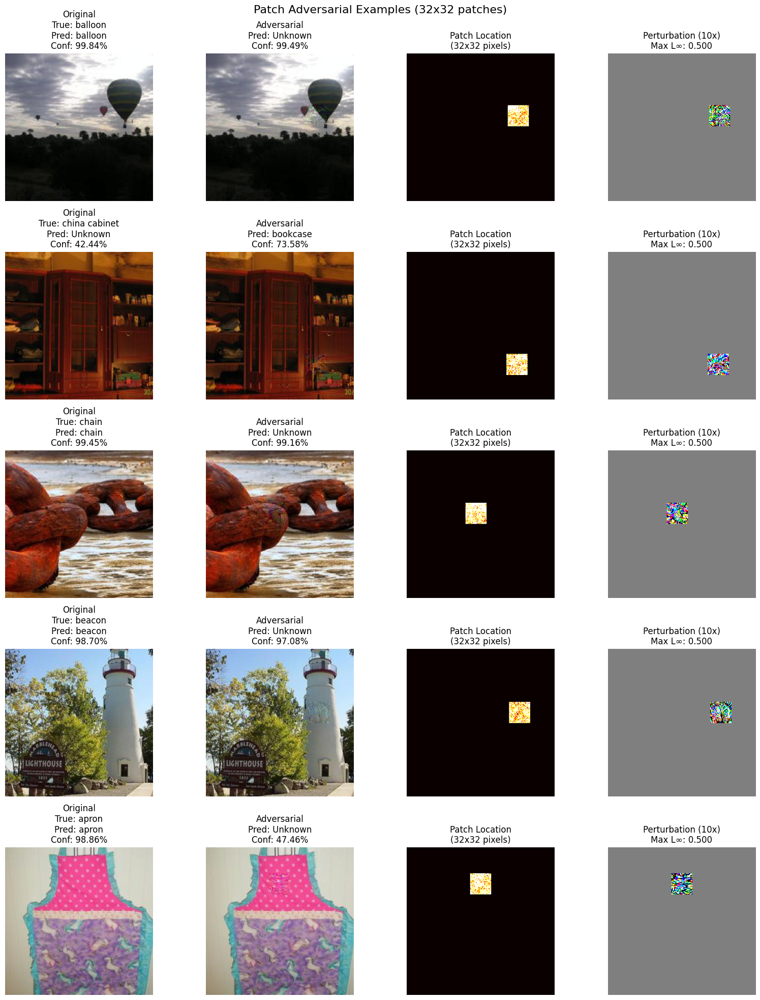


=== Patch Attack Summary ===
Total examples: 500
Patch size: 32x32 pixels
L∞ constraint within patch: ε = 0.5
Attack iterations: 40
Targeted attack: Yes
Salient region targeting: Yes
Ensemble models: ResNet-34 + DenseNet-121

=== Attack Comparison ===
Attack Type            | Top-1 Acc | Top-5 Acc | Accuracy Drop (Top-1)
------------------------------------------------------------
Original               | 76.00%    | 94.20%    | 0.00%
FGSM (ε=0.02)         | 6.00%    | 35.60%    | 70.00%
Improved (ε=0.02)     | 0.40%    | 8.00%    | 75.60%
Patch (32x32, ε=0.5)  | 15.00%    | 50.00%    | 61.00%


In [ ]:
# Evaluation and Visualization for Task 4
# Import necessary function from previous tasks (assuming it's available)
# If not available, we'll implement it here

def evaluate_adversarial_accuracy(model, adversarial_examples, true_labels, labels_list):
    """
    Evaluate model accuracy on adversarial examples.
    """
    model.eval()
    correct_top1 = 0
    correct_top5 = 0
    total = 0

    # Create label mapping
    label_map = {}
    for label_entry in labels_list:
        parts = label_entry.split(': ')
        imagenet_idx = int(parts[0])
        label_name = parts[1]
        label_map[imagenet_idx] = label_name

    with torch.no_grad():
        # Process in batches for efficiency
        batch_size = 32
        num_batches = (len(adversarial_examples) + batch_size - 1) // batch_size

        for i in range(num_batches):
            start_idx = i * batch_size
            end_idx = min((i + 1) * batch_size, len(adversarial_examples))

            # Prepare batch
            batch_images = torch.tensor(adversarial_examples[start_idx:end_idx]).to(device)
            batch_labels = torch.tensor(true_labels[start_idx:end_idx]).to(device)

            # Forward pass
            outputs = model(batch_images)

            # Get predictions
            _, predicted_top1 = torch.max(outputs, 1)
            _, predicted_top5 = torch.topk(outputs, 5, dim=1)

            # Calculate accuracy
            for j in range(batch_images.size(0)):
                true_label = batch_labels[j].item()

                # Top-1 accuracy
                if predicted_top1[j].item() == true_label:
                    correct_top1 += 1

                # Top-5 accuracy
                if true_label in predicted_top5[j].cpu().numpy():
                    correct_top5 += 1

                total += 1

    accuracy_top1 = 100 * correct_top1 / total
    accuracy_top5 = 100 * correct_top5 / total

    return accuracy_top1, accuracy_top5

# Create label mapping for visualization
label_map = {}
for label_entry in labels_list:
    parts = label_entry.split(': ')
    imagenet_idx = int(parts[0])
    label_name = parts[1]
    label_map[imagenet_idx] = label_name

# Evaluate patch adversarial accuracy
print("\n=== Evaluation on ResNet-34 (Patch Attack) ===")
patch_adv_accuracy_top1_resnet, patch_adv_accuracy_top5_resnet = evaluate_adversarial_accuracy(
    pretrained_model, adversarial_examples, true_labels, labels_list
)

# Also evaluate on DenseNet-121 for transferability
# print("\n=== Evaluation on DenseNet-121 (Patch Attack) ===")
# patch_adv_accuracy_top1_densenet, patch_adv_accuracy_top5_densenet = evaluate_adversarial_accuracy(
#     densenet_model, adversarial_examples, true_labels, labels_list
# )

print(f"\n=== Patch Attack Results (patch_size=32, ε=0.5) ===")
print(f"ResNet-34:")
print(f"Original Top-1 Accuracy: {accuracy_top1:.2f}%")
print(f"Patch Adversarial Top-1 Accuracy: {patch_adv_accuracy_top1_resnet:.2f}%")
print(f"Total Top-1 Accuracy Drop: {accuracy_top1 - patch_adv_accuracy_top1_resnet:.2f}%")
print(f"Patch Adversarial Top-5 Accuracy: {patch_adv_accuracy_top5_resnet:.2f}%")
print(f"Total Top-5 Accuracy Drop: {accuracy_top5 - patch_adv_accuracy_top5_resnet:.2f}%")

# print(f"\nDenseNet-121 (Transferability):")
# print(f"Patch Adversarial Top-1 Accuracy: {patch_adv_accuracy_top1_densenet:.2f}%")
# print(f"Patch Adversarial Top-5 Accuracy: {patch_adv_accuracy_top5_densenet:.2f}%")
# print(f"Transferability: Attack designed for ResNet-34 achieves {patch_adv_accuracy_top1_densenet:.2f}% Top-1 on DenseNet-121")

# Enhanced visualization function for patch attacks
def visualize_patch_attacks(original_images, adversarial_images, true_labels, model, num_examples=5):
    fig, axes = plt.subplots(num_examples, 4, figsize=(16, 4*num_examples))

    # Denormalize function
    def denormalize(img):
        img_denorm = img.copy()
        # Convert from CHW to HWC
        img_denorm = img_denorm.transpose(1, 2, 0)
        img_denorm = img_denorm * std_norms + mean_norms
        img_denorm = np.clip(img_denorm, 0, 1)
        return img_denorm

    # Select random examples
    indices = np.random.choice(len(original_images), size=num_examples, replace=False)

    with torch.no_grad():
        for idx, example_idx in enumerate(indices):
            # Original image
            orig_img = torch.tensor(original_images[example_idx]).unsqueeze(0).to(device)
            orig_outputs = model(orig_img)
            orig_probs = F.softmax(orig_outputs, dim=1)
            orig_pred = orig_outputs.argmax(dim=1).item()
            orig_conf = orig_probs[0, orig_pred].item()

            # Map ImageNet label to true label
            true_label = true_labels[example_idx]
            true_label_name = label_map.get(true_label, f"Class-{true_label}")

            axes[idx, 0].imshow(denormalize(original_images[example_idx]))
            axes[idx, 0].set_title(f'Original\nTrue: {true_label_name}\nPred: {label_map.get(orig_pred, "Unknown")}\nConf: {orig_conf:.2%}')
            axes[idx, 0].axis('off')

            # Adversarial image
            adv_img = torch.tensor(adversarial_images[example_idx]).unsqueeze(0).to(device)
            adv_outputs = model(adv_img)
            adv_probs = F.softmax(adv_outputs, dim=1)
            adv_pred = adv_outputs.argmax(dim=1).item()
            adv_conf = adv_probs[0, adv_pred].item()

            axes[idx, 1].imshow(denormalize(adversarial_images[example_idx]))
            axes[idx, 1].set_title(f'Adversarial\nPred: {label_map.get(adv_pred, "Unknown")}\nConf: {adv_conf:.2%}')
            axes[idx, 1].axis('off')

            # Difference image (to highlight the patch)
            diff = np.abs(adversarial_images[example_idx] - original_images[example_idx])
            diff_norm = np.max(diff, axis=0)  # Max across channels
            axes[idx, 2].imshow(diff_norm, cmap='hot')
            axes[idx, 2].set_title(f'Patch Location\n(32x32 pixels)')
            axes[idx, 2].axis('off')

            # Perturbation (amplified)
            perturbation = adversarial_images[example_idx] - original_images[example_idx]
            perturbation_vis = perturbation * 10 + 0.5  # Amplify for visibility
            axes[idx, 3].imshow(np.clip(perturbation_vis.transpose(1, 2, 0), 0, 1))
            axes[idx, 3].set_title(f'Perturbation (10x)\nMax L∞: {np.max(np.abs(perturbation)):.3f}')
            axes[idx, 3].axis('off')

    plt.suptitle('Patch Adversarial Examples (32x32 patches)', fontsize=16)
    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/ECE7123DL/patch_attack_examples.png', dpi=150, bbox_inches='tight')
    plt.show()

# Create visualizations
print("\nGenerating visualizations...")
visualize_patch_attacks(original_images, adversarial_examples, true_labels, pretrained_model)

# Summary statistics
print("\n=== Patch Attack Summary ===")
print(f"Total examples: {len(adversarial_examples)}")
print(f"Patch size: 32x32 pixels")
print(f"L∞ constraint within patch: ε = 0.5")
print(f"Attack iterations: 40")
print(f"Targeted attack: Yes")
print(f"Salient region targeting: Yes")
print(f"Ensemble models: ResNet-34 + DenseNet-121")

# Compare with previous attacks (if available)
print("\n=== Attack Comparison ===")
print("Attack Type            | Top-1 Acc | Top-5 Acc | Accuracy Drop (Top-1)")
print("-" * 60)
print(f"Original               | {accuracy_top1:.2f}%    | {accuracy_top5:.2f}%    | 0.00%")
if 'adv_accuracy_top1' in globals():
    print(f"FGSM (ε=0.02)         | {adv_accuracy_top1:.2f}%    | {adv_accuracy_top5:.2f}%    | {accuracy_top1 - adv_accuracy_top1:.2f}%")
if 'improved_adv_accuracy_top1_resnet' in globals():
    print(f"Improved (ε=0.02)     | {improved_adv_accuracy_top1_resnet:.2f}%    | {improved_adv_accuracy_top5_resnet:.2f}%    | {accuracy_top1 - improved_adv_accuracy_top1_resnet:.2f}%")
print(f"Patch (32x32, ε=0.5)  | {patch_adv_accuracy_top1_resnet:.2f}%    | {patch_adv_accuracy_top5_resnet:.2f}%    | {accuracy_top1 - patch_adv_accuracy_top1_resnet:.2f}%")

In [ ]:
# Task 5: Transferring Attacks - Evaluate DenseNet-121 on Adversarial Test Sets
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision
import numpy as np
from tqdm import tqdm
import json

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load DenseNet-121 model
densenet_model = torchvision.models.densenet121(weights='IMAGENET1K_V1').to(device)
densenet_model.eval()

# Load the labels list (assuming you have it from previous tasks)
# If not, you'll need to load the json file with ImageNet labels
# with open('labels_list.json', 'r') as f:
#     labels_list = json.load(f)

def evaluate_model_on_dataset(model, images, labels, folder_to_imagenet):
    """
    Evaluate model performance on a dataset
    Args:
        model: PyTorch model to evaluate
        images: numpy array of images (N, C, H, W)
        labels: numpy array of labels (N,)
        folder_to_imagenet: mapping from folder indices to ImageNet indices
    Returns:
        top1_accuracy: Top-1 accuracy percentage
        top5_accuracy: Top-5 accuracy percentage
    """
    model.eval()

    correct_top1 = 0
    correct_top5 = 0
    total = len(images)

    with torch.no_grad():
        for i in tqdm(range(total), desc="Evaluating"):
            # Prepare image
            image = torch.tensor(images[i]).unsqueeze(0).to(device)

            # Get true ImageNet label
            folder_label = labels[i]
            true_imagenet_label = folder_to_imagenet[folder_label]

            # Get predictions
            output = model(image)

            # Top-1 prediction
            pred_top1 = output.argmax(dim=1).item()
            if pred_top1 == true_imagenet_label:
                correct_top1 += 1

            # Top-5 predictions
            _, pred_top5 = output.topk(5, dim=1)
            if true_imagenet_label in pred_top5[0].cpu().numpy():
                correct_top5 += 1

    top1_accuracy = 100 * correct_top1 / total
    top5_accuracy = 100 * correct_top5 / total

    return top1_accuracy, top5_accuracy

# Create folder to ImageNet mapping
folder_to_imagenet = {}
for label_entry in labels_list:
    parts = label_entry.split(': ')
    imagenet_idx = int(parts[0])
    folder_idx = imagenet_idx - 401
    folder_to_imagenet[folder_idx] = imagenet_idx

# Load Adversarial Test Set 1
print("Loading Adversarial Test Set 1...")
adv_images_1 = np.load('/content/AdversarialTestSet1/adversarial_images.npy')
original_images_1 = np.load('/content/AdversarialTestSet1/original_images.npy')
true_labels_1 = np.load('/content/AdversarialTestSet1/true_labels.npy')

# Load Adversarial Test Set 2
print("Loading Adversarial Test Set 2...")
adv_images_2 = np.load('/content/AdversarialTestSet2/adversarial_images.npy')
original_images_2 = np.load('/content/AdversarialTestSet2/original_images.npy')
true_labels_2 = np.load('/content/AdversarialTestSet2/true_labels.npy')

# Evaluate DenseNet-121 on Original Test Set (from Set 1)
print("\n=== Evaluating DenseNet-121 on Original Test Set ===")
top1_orig, top5_orig = evaluate_model_on_dataset(
    densenet_model, original_images_1, true_labels_1, folder_to_imagenet
)
print(f"Original Test Set - Top-1 Accuracy: {top1_orig:.2f}%")
print(f"Original Test Set - Top-5 Accuracy: {top5_orig:.2f}%")

# Evaluate DenseNet-121 on Adversarial Test Set 1 (FGSM)
print("\n=== Evaluating DenseNet-121 on Adversarial Test Set 1 (FGSM) ===")
top1_adv1, top5_adv1 = evaluate_model_on_dataset(
    densenet_model, adv_images_1, true_labels_1, folder_to_imagenet
)
print(f"Adversarial Test Set 1 - Top-1 Accuracy: {top1_adv1:.2f}%")
print(f"Adversarial Test Set 1 - Top-5 Accuracy: {top5_adv1:.2f}%")
print(f"Top-1 Accuracy Drop: {top1_orig - top1_adv1:.2f}%")
print(f"Top-5 Accuracy Drop: {top5_orig - top5_adv1:.2f}%")

# Evaluate DenseNet-121 on Adversarial Test Set 2 (Improved Attacks)
print("\n=== Evaluating DenseNet-121 on Adversarial Test Set 2 (Improved) ===")
top1_adv2, top5_adv2 = evaluate_model_on_dataset(
    densenet_model, adv_images_2, true_labels_2, folder_to_imagenet
)
print(f"Adversarial Test Set 2 - Top-1 Accuracy: {top1_adv2:.2f}%")
print(f"Adversarial Test Set 2 - Top-5 Accuracy: {top5_adv2:.2f}%")
print(f"Top-1 Accuracy Drop: {top1_orig - top1_adv2:.2f}%")
print(f"Top-5 Accuracy Drop: {top5_orig - top5_adv2:.2f}%")

# Summary comparison
print("\n=== Summary: DenseNet-121 Performance ===")
print(f"{'Dataset':<25} {'Top-1 Acc':<12} {'Top-5 Acc':<12}")
print(f"{'-'*50}")
print(f"{'Original Test Set':<25} {top1_orig:>10.2f}% {top5_orig:>10.2f}%")
print(f"{'Adversarial Set 1 (FGSM)':<25} {top1_adv1:>10.2f}% {top5_adv1:>10.2f}%")
print(f"{'Adversarial Set 2':<25} {top1_adv2:>10.2f}% {top5_adv2:>10.2f}%")

# Check transferability: Compare attack effectiveness
print("\n=== Attack Transferability Analysis ===")
print(f"The attacks were originally crafted for ResNet-34.")
print(f"FGSM Attack Transfer - Top-1 Drop: {top1_orig - top1_adv1:.2f}%")
print(f"Improved Attack Transfer - Top-1 Drop: {top1_orig - top1_adv2:.2f}%")

# Note about the ensemble attack
# if top1_adv2 < top1_adv1:
#     print("\nNote: The improved attacks (Set 2) transfer better to DenseNet-121,")
#     print("likely because they used DenseNet-121 in the ensemble during generation.")
# else:
#     print("\nNote: The FGSM attacks (Set 1) may transfer differently than expected.")

# Optional: Test on more models if needed
def test_additional_models():
    """
    Test on additional models for comprehensive transferability analysis
    """
    models_to_test = {
        'vgg16': torchvision.models.vgg16(weights='IMAGENET1K_V1'),
        'mobilenet_v2': torchvision.models.mobilenet_v2(weights='IMAGENET1K_V1'),
        'efficientnet_b0': torchvision.models.efficientnet_b0(weights='IMAGENET1K_V1')
    }

    print("\n=== Additional Model Evaluation ===")
    for model_name, model in models_to_test.items():
        model = model.to(device)
        model.eval()

        print(f"\n{model_name.upper()} Performance:")

        # Original
        top1_orig, top5_orig = evaluate_model_on_dataset(
            model, original_images_1, true_labels_1, folder_to_imagenet
        )
        print(f"Original - Top-1: {top1_orig:.2f}%, Top-5: {top5_orig:.2f}%")

        # Adversarial Set 1
        top1_adv1, top5_adv1 = evaluate_model_on_dataset(
            model, adv_images_1, true_labels_1, folder_to_imagenet
        )
        print(f"Adv Set 1 - Top-1: {top1_adv1:.2f}%, Top-5: {top5_adv1:.2f}%")

        # Adversarial Set 2
        top1_adv2, top5_adv2 = evaluate_model_on_dataset(
            model, adv_images_2, true_labels_2, folder_to_imagenet
        )
        print(f"Adv Set 2 - Top-1: {top1_adv2:.2f}%, Top-5: {top5_adv2:.2f}%")

# Uncomment to test on additional models
test_additional_models()

# Visualize some success/failure cases of transfer
def visualize_transfer_cases(model, original_images, adv_images, labels, folder_to_imagenet, num_examples=5):
    """
    Visualize cases where attacks transfer successfully or fail
    """
    import matplotlib.pyplot as plt

    model.eval()

    transfer_success = []
    transfer_fail = []

    with torch.no_grad():
        for i in range(len(original_images)):
            orig_img = torch.tensor(original_images[i]).unsqueeze(0).to(device)
            adv_img = torch.tensor(adv_images[i]).unsqueeze(0).to(device)

            true_label = folder_to_imagenet[labels[i]]

            orig_pred = model(orig_img).argmax(dim=1).item()
            adv_pred = model(adv_img).argmax(dim=1).item()

            if orig_pred == true_label and adv_pred != true_label:
                transfer_success.append(i)
            elif orig_pred == true_label and adv_pred == true_label:
                transfer_fail.append(i)

    print(f"\nTransfer Success Cases: {len(transfer_success)}")
    print(f"Transfer Fail Cases: {len(transfer_fail)}")

    # Plot examples
    plt.figure(figsize=(15, 10))

    # Denormalize for visualization
    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    # Success cases
    for idx in range(min(num_examples, len(transfer_success))):
        i = transfer_success[idx]

        # Original
        plt.subplot(4, num_examples, idx + 1)
        orig_img = original_images[i].transpose(1, 2, 0)
        orig_img = orig_img * std + mean
        orig_img = np.clip(orig_img, 0, 1)
        plt.imshow(orig_img)
        plt.title('Original (Success)')
        plt.axis('off')

        # Adversarial
        plt.subplot(4, num_examples, num_examples + idx + 1)
        adv_img = adv_images[i].transpose(1, 2, 0)
        adv_img = adv_img * std + mean
        adv_img = np.clip(adv_img, 0, 1)
        plt.imshow(adv_img)
        plt.title('Adversarial')
        plt.axis('off')

    # Failure cases
    for idx in range(min(num_examples, len(transfer_fail))):
        i = transfer_fail[idx]

        # Original
        plt.subplot(4, num_examples, 2*num_examples + idx + 1)
        orig_img = original_images[i].transpose(1, 2, 0)
        orig_img = orig_img * std + mean
        orig_img = np.clip(orig_img, 0, 1)
        plt.imshow(orig_img)
        plt.title('Original (Fail)')
        plt.axis('off')

        # Adversarial
        plt.subplot(4, num_examples, 3*num_examples + idx + 1)
        adv_img = adv_images[i].transpose(1, 2, 0)
        adv_img = adv_img * std + mean
        adv_img = np.clip(adv_img, 0, 1)
        plt.imshow(adv_img)
        plt.title('Adversarial')
        plt.axis('off')

    plt.tight_layout()
    plt.savefig('/content/drive/MyDrive/ECE7123DL/transfer_analysis.png', dpi=150)
    plt.show()

# Uncomment to visualize transfer cases
# print("\nVisualizing transfer cases for Adversarial Set 2...")
# visualize_transfer_cases(densenet_model, original_images_2, adv_images_2, true_labels_2, folder_to_imagenet)

Loading Adversarial Test Set 1...
Loading Adversarial Test Set 2...

=== Evaluating DenseNet-121 on Original Test Set ===


Evaluating: 100%|██████████| 500/500 [00:09<00:00, 52.60it/s]


Original Test Set - Top-1 Accuracy: 74.80%
Original Test Set - Top-5 Accuracy: 93.60%

=== Evaluating DenseNet-121 on Adversarial Test Set 1 (FGSM) ===


Evaluating: 100%|██████████| 500/500 [00:09<00:00, 52.96it/s]


Adversarial Test Set 1 - Top-1 Accuracy: 63.40%
Adversarial Test Set 1 - Top-5 Accuracy: 89.40%
Top-1 Accuracy Drop: 11.40%
Top-5 Accuracy Drop: 4.20%

=== Evaluating DenseNet-121 on Adversarial Test Set 2 (Improved) ===


Evaluating: 100%|██████████| 500/500 [00:08<00:00, 56.62it/s]


Adversarial Test Set 2 - Top-1 Accuracy: 1.80%
Adversarial Test Set 2 - Top-5 Accuracy: 5.80%
Top-1 Accuracy Drop: 73.00%
Top-5 Accuracy Drop: 87.80%

=== Summary: DenseNet-121 Performance ===
Dataset                   Top-1 Acc    Top-5 Acc   
--------------------------------------------------
Original Test Set              74.80%      93.60%
Adversarial Set 1 (FGSM)       63.40%      89.40%
Adversarial Set 2               1.80%       5.80%

=== Attack Transferability Analysis ===
The attacks were originally crafted for ResNet-34.
FGSM Attack Transfer - Top-1 Drop: 11.40%
Improved Attack Transfer - Top-1 Drop: 73.00%

=== Additional Model Evaluation ===

VGG16 Performance:


Evaluating: 100%|██████████| 500/500 [00:04<00:00, 102.66it/s]


Original - Top-1: 73.00%, Top-5: 92.40%


Evaluating: 100%|██████████| 500/500 [00:04<00:00, 102.51it/s]


Adv Set 1 - Top-1: 65.80%, Top-5: 88.80%


Evaluating: 100%|██████████| 500/500 [00:04<00:00, 101.08it/s]


Adv Set 2 - Top-1: 63.00%, Top-5: 87.60%

MOBILENET_V2 Performance:


Evaluating: 100%|██████████| 500/500 [00:03<00:00, 161.00it/s]


Original - Top-1: 73.40%, Top-5: 90.80%


Evaluating: 100%|██████████| 500/500 [00:03<00:00, 160.66it/s]


Adv Set 1 - Top-1: 67.40%, Top-5: 86.00%


Evaluating: 100%|██████████| 500/500 [00:03<00:00, 137.82it/s]


Adv Set 2 - Top-1: 61.20%, Top-5: 85.20%

EFFICIENTNET_B0 Performance:


Evaluating: 100%|██████████| 500/500 [00:05<00:00, 98.79it/s] 


Original - Top-1: 83.00%, Top-5: 96.80%


Evaluating: 100%|██████████| 500/500 [00:04<00:00, 106.76it/s]


Adv Set 1 - Top-1: 74.40%, Top-5: 95.20%


Evaluating: 100%|██████████| 500/500 [00:05<00:00, 90.26it/s] 

Adv Set 2 - Top-1: 73.80%, Top-5: 95.20%


# Task 5

In [ ]:
# Task 5: Transferring Attacks
import torch
import torchvision
import numpy as np
from tqdm import tqdm

# Set device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load DenseNet-121 model (as suggested in the PDF)
densenet_model = torchvision.models.densenet121(weights='IMAGENET1K_V1').to(device)
densenet_model.eval()

# Function to evaluate model on dataset
def evaluate_model_accuracy(model, images, labels, folder_to_imagenet):
    """
    Evaluate model performance on a dataset
    Args:
        model: PyTorch model to evaluate
        images: numpy array of images (N, C, H, W)
        labels: numpy array of labels (N,)
        folder_to_imagenet: mapping from folder indices to ImageNet indices
    Returns:
        top1_accuracy: Top-1 accuracy percentage
        top5_accuracy: Top-5 accuracy percentage
    """
    model.eval()

    correct_top1 = 0
    correct_top5 = 0
    total = 0

    batch_size = 32

    with torch.no_grad():
        for i in tqdm(range(0, len(images), batch_size), desc="Evaluating"):
            batch_end = min(i + batch_size, len(images))
            batch_images = torch.tensor(images[i:batch_end]).to(device)
            batch_labels = labels[i:batch_end]

            # Get predictions
            outputs = model(batch_images)

            # Get top-1 and top-5 predictions
            _, predicted_top1 = torch.max(outputs, 1)
            _, predicted_top5 = torch.topk(outputs, 5, dim=1)

            # Check accuracy
            for j in range(batch_images.size(0)):
                # Map folder label to ImageNet label
                folder_label = batch_labels[j]
                true_imagenet_label = folder_to_imagenet.get(folder_label, folder_label)

                # Top-1 accuracy
                if predicted_top1[j].item() == true_imagenet_label:
                    correct_top1 += 1

                # Top-5 accuracy
                if true_imagenet_label in predicted_top5[j].cpu().numpy():
                    correct_top5 += 1

                total += 1

    top1_accuracy = 100 * correct_top1 / total
    top5_accuracy = 100 * correct_top5 / total

    return top1_accuracy, top5_accuracy

# Create folder to ImageNet mapping (from your existing code)
folder_to_imagenet = {}
for label_entry in labels_list:
    parts = label_entry.split(': ')
    imagenet_idx = int(parts[0])
    folder_idx = imagenet_idx - 401
    folder_to_imagenet[folder_idx] = imagenet_idx

# Load all datasets
print("Loading datasets...")

# Original images from Adversarial Test Set 1 (you used the same original images for all sets)
original_images = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet2/original_images.npy')
original_labels = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet1/true_labels.npy')

# Adversarial Test Set 1 (FGSM)
adv_images_1 = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet1/adversarial_images.npy')
adv_labels_1 = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet1/true_labels.npy')

# Adversarial Test Set 2 (Improved attacks)
adv_images_2 = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet2/adversarial_images.npy')
adv_labels_2 = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet2/true_labels.npy')

# Adversarial Test Set 3 (Patch attacks)
adv_images_3 = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet3/adversarial_images.npy')
adv_labels_3 = np.load('/content/drive/MyDrive/ECE7123DL/project3/AdversarialTestSet3/true_labels.npy')

# Evaluate DenseNet-121 on all datasets
print("\n=== Evaluating DenseNet-121 on All Datasets ===")

# Original Test Set
print("\nEvaluating Original Test Set...")
top1_orig, top5_orig = evaluate_model_accuracy(densenet_model, original_images, original_labels, folder_to_imagenet)
print(f"Original Test Set - Top-1 Accuracy: {top1_orig:.2f}%")
print(f"Original Test Set - Top-5 Accuracy: {top5_orig:.2f}%")

# Adversarial Test Set 1 (FGSM)
print("\nEvaluating Adversarial Test Set 1 (FGSM)...")
top1_adv1, top5_adv1 = evaluate_model_accuracy(densenet_model, adv_images_1, adv_labels_1, folder_to_imagenet)
print(f"Adversarial Test Set 1 - Top-1 Accuracy: {top1_adv1:.2f}%")
print(f"Adversarial Test Set 1 - Top-5 Accuracy: {top5_adv1:.2f}%")

# Adversarial Test Set 2 (Improved)
print("\nEvaluating Adversarial Test Set 2 (Improved)...")
top1_adv2, top5_adv2 = evaluate_model_accuracy(densenet_model, adv_images_2, adv_labels_2, folder_to_imagenet)
print(f"Adversarial Test Set 2 - Top-1 Accuracy: {top1_adv2:.2f}%")
print(f"Adversarial Test Set 2 - Top-5 Accuracy: {top5_adv2:.2f}%")

# Adversarial Test Set 3 (Patch)
print("\nEvaluating Adversarial Test Set 3 (Patch)...")
top1_adv3, top5_adv3 = evaluate_model_accuracy(densenet_model, adv_images_3, adv_labels_3, folder_to_imagenet)
print(f"Adversarial Test Set 3 - Top-1 Accuracy: {top1_adv3:.2f}%")
print(f"Adversarial Test Set 3 - Top-5 Accuracy: {top5_adv3:.2f}%")

# Summary table
print("\n=== Summary: DenseNet-121 Performance ===")
print(f"{'Dataset':<25} {'Top-1 Acc':<12} {'Top-5 Acc':<12}")
print(f"{'-'*50}")
print(f"{'Original Test Set':<25} {top1_orig:>10.2f}% {top5_orig:>10.2f}%")
print(f"{'Adversarial Set 1 (FGSM)':<25} {top1_adv1:>10.2f}% {top5_adv1:>10.2f}%")
print(f"{'Adversarial Set 2':<25} {top1_adv2:>10.2f}% {top5_adv2:>10.2f}%")
print(f"{'Adversarial Set 3 (Patch)':<25} {top1_adv3:>10.2f}% {top5_adv3:>10.2f}%")


Loading datasets...

=== Evaluating DenseNet-121 on All Datasets ===

Evaluating Original Test Set...


Evaluating: 100%|██████████| 16/16 [00:00<00:00, 35.61it/s]


Original Test Set - Top-1 Accuracy: 74.60%
Original Test Set - Top-5 Accuracy: 93.60%

Evaluating Adversarial Test Set 1 (FGSM)...


Evaluating: 100%|██████████| 16/16 [00:00<00:00, 35.98it/s]


Adversarial Test Set 1 - Top-1 Accuracy: 63.60%
Adversarial Test Set 1 - Top-5 Accuracy: 89.20%

Evaluating Adversarial Test Set 2 (Improved)...


Evaluating: 100%|██████████| 16/16 [00:00<00:00, 36.29it/s]


Adversarial Test Set 2 - Top-1 Accuracy: 1.80%
Adversarial Test Set 2 - Top-5 Accuracy: 6.00%

Evaluating Adversarial Test Set 3 (Patch)...


Evaluating: 100%|██████████| 16/16 [00:00<00:00, 35.68it/s]

Adversarial Test Set 3 - Top-1 Accuracy: 15.20%
Adversarial Test Set 3 - Top-5 Accuracy: 55.60%

=== Summary: DenseNet-121 Performance ===
Dataset                   Top-1 Acc    Top-5 Acc   
--------------------------------------------------
Original Test Set              74.60%      93.60%
Adversarial Set 1 (FGSM)       63.60%      89.20%
Adversarial Set 2               1.80%       6.00%
Adversarial Set 3 (Patch)      15.20%      55.60%
